# Imports: run when starting a session!

In [3]:
# General dependencies:
import anndata
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import scanpy as sc
import math
import os
import importlib

# Not strictly necessary:
from scipy.stats import chi2_contingency
from sklearn.metrics import adjusted_rand_score

In [ ]:
# From custom scripts, also imported in their corresponding code chunks:
from scripts.preprocessing import preprocess
from scripts.transforms import apply_transform
from scripts.anndata_helpers import load_and_build_anndata, save_h5ad
from scripts.annotation import compute_positivity_matrix
from scripts.annotation import plot_marker_gmm_adata
from scripts.plotting import marker_correlation_plots
from scripts.spatialmapping import plot_spatial_marker
from scripts.celltype_rules import assign_cell_types
from scripts.spatialmapping import plot_spatial_cell_types
from scripts.spatialmapping import plot_spatial_subset
from scripts.cluster_annotation import summarize_single_cluster

# Load CSV raw

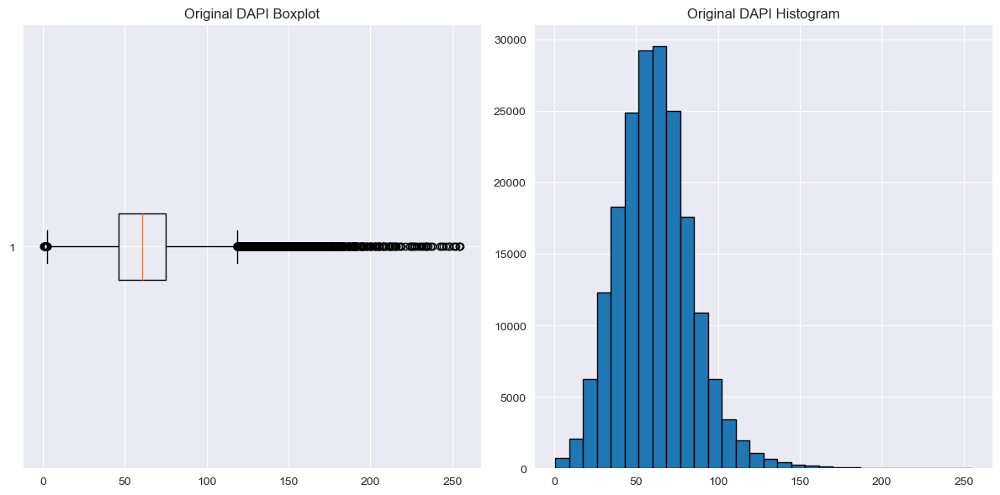

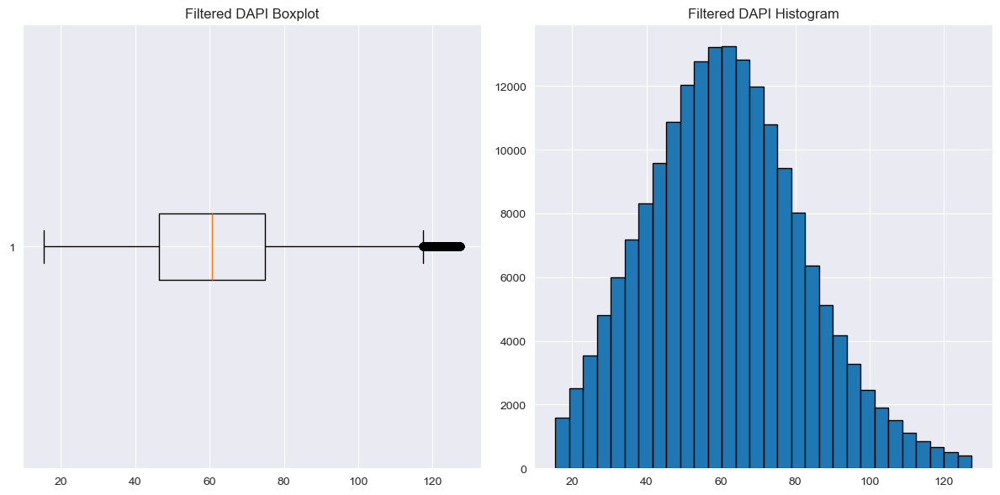

Filtered data saved to: ../data/processed/IHOPE26_LN_InstanSeq_filtered_outliers_TEST.csv


In [120]:
from scripts.preprocessing import preprocess

# Run preprocessing (specify input file)
input_file = "../data/processed/IHOPE26_LN_InstanSeq_modified.csv"
output_file = "../data/processed/IHOPE26_LN_InstanSeq_filtered_outliers.csv"
preprocess(input_file, output_file, plot = True)


# Transformations

**arcsinh/zscore/none**

Transformations script returns:

df_out: DataFrame with metadata + transformed markers

transformed_cols: list of columns that were transformed

metadata_cols: list of metadata columns

fig: the matplotlib figure object

**Note** that even when applying no transformation, the data columns are still reorganized. You still need to apply the 'none' transformation if you want to use raw marker intensities.

Saved CSV to: ../data/processed/IHOPE26_LN_InstanSeq_filtered_outliers_TEST_RAW.csv
Plot saved to: ../results/figures/IHOPE26_LN_InstanSeq_filtered_outliers_TEST_RAW_distributions.png


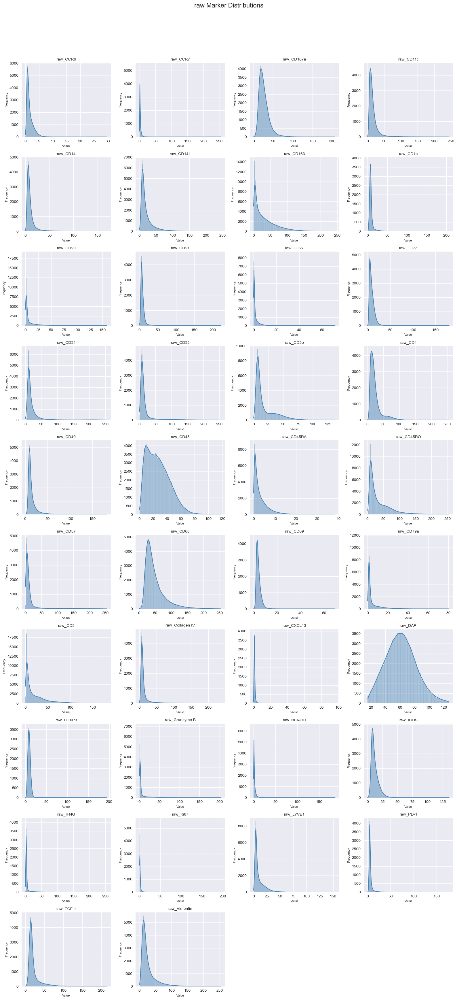

In [3]:
from scripts.transforms import apply_transform

method = "none"
#cofactor = 5.0    # Uncomment to use if applying arcsinh normalization
input_file = "../data/processed/IHOPE26_LN_InstanSeq_filtered_outliers.csv"
output_file = "../data/processed/IHOPE26_LN_InstanSeq_filtered_outliers_RAW.csv"

df_out, markers, metadata, fig = apply_transform(
    input_file=input_file,
    method=method,
    #cofactor=cofactor, # Uncomment this too if applying arcsinh
    output_file=output_file,
    save_plot=True
)


# Building AnnData object

In [ ]:
from scripts.anndata_helpers import load_and_build_anndata, save_h5ad

# Input file:
filename = "../data/processed/IHOPE26_LN_InstanSeq_filtered_outliers_RAW.csv"

# Create AnnData:
adata = load_and_build_anndata(filename)

# Specify "notes" about the AnnData object:
adata.uns['normalization'] = 'raw'
adata.uns['sample_id'] = 'IHOPE26'

# Save AnnData as h5ad
h5adpath = "../data/processed/anndata/IHOPE26_LN_InstanSeq_filtered_outliers_RAW.h5ad"
save_h5ad(adata, h5adpath)

# Inspect the contents
print(adata)
print(adata.obsm['spatial'].shape)

In [4]:
# Now you can read the AnnData object anytime like this:
adata = anndata.read_h5ad("../data/processed/anndata/IHOPE26_LN_InstanSeq_filtered_outliers_RAW.h5ad")

In [5]:
print(adata.var)

Empty DataFrame
Columns: []
Index: [raw_CCR6, raw_CCR7, raw_CD107a, raw_CD11c, raw_CD14, raw_CD141, raw_CD163, raw_CD1c, raw_CD20, raw_CD21, raw_CD27, raw_CD31, raw_CD34, raw_CD38, raw_CD3e, raw_CD4, raw_CD40, raw_CD45, raw_CD45RA, raw_CD45RO, raw_CD57, raw_CD68, raw_CD69, raw_CD79a, raw_CD8, raw_Collagen IV, raw_CXCL13, raw_DAPI, raw_FOXP3, raw_Granzyme B, raw_HLA-DR, raw_ICOS, raw_IFNG, raw_Ki67, raw_LYVE1, raw_PD-1, raw_TCF-1, raw_Vimentin]


# Marker positivity annotation using GMM thresholds

In [9]:
from scripts.annotation import compute_positivity_matrix

# Annotate all cells with GMM-based positivity for canonical markers, fallback to percentile if unimodal
adata, thresholds, best_gmms = compute_positivity_matrix(
    adata,
    quantile=0.95,
    random_state=0
)


Added 38 _pos columns to adata.obs
Unimodal markers: []
Bimodal markers: ['CCR6', 'CCR7', 'CD107a', 'CD11c', 'CD14', 'CD141', 'CD163', 'CD1c', 'CD20', 'CD21', 'CD27', 'CD31', 'CD34', 'CD38', 'CD3e', 'CD4', 'CD40', 'CD45', 'CD45RA', 'CD45RO', 'CD57', 'CD68', 'CD69', 'CD79a', 'CD8', 'Collagen IV', 'CXCL13', 'DAPI', 'FOXP3', 'Granzyme B', 'HLA-DR', 'ICOS', 'IFNG', 'Ki67', 'LYVE1', 'PD-1', 'TCF-1', 'Vimentin']


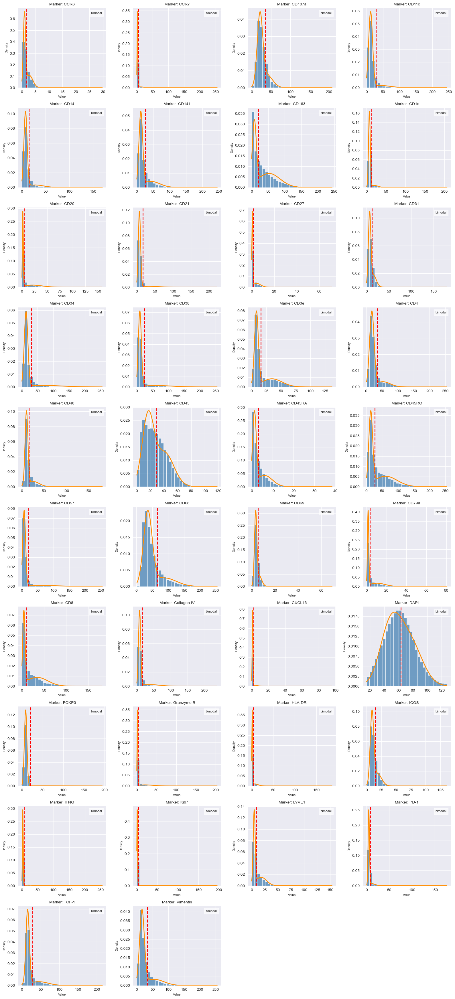

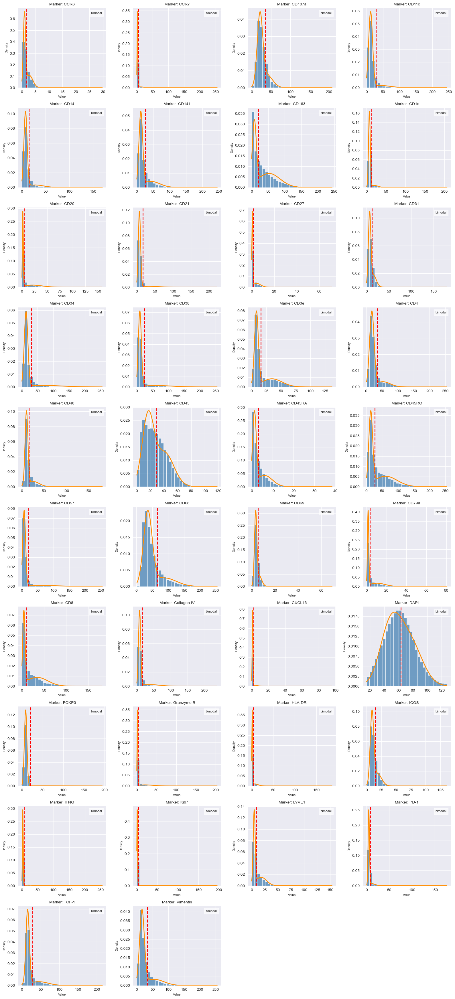

In [10]:
from scripts.annotation import plot_marker_gmm_adata
plot_marker_gmm_adata(adata,
                      thresholds,
                      best_gmms,
                      title_prefix="Marker: ",
                      save=False,
                      filename="GMM_histograms")

Optional correlation plots between markers of interest:

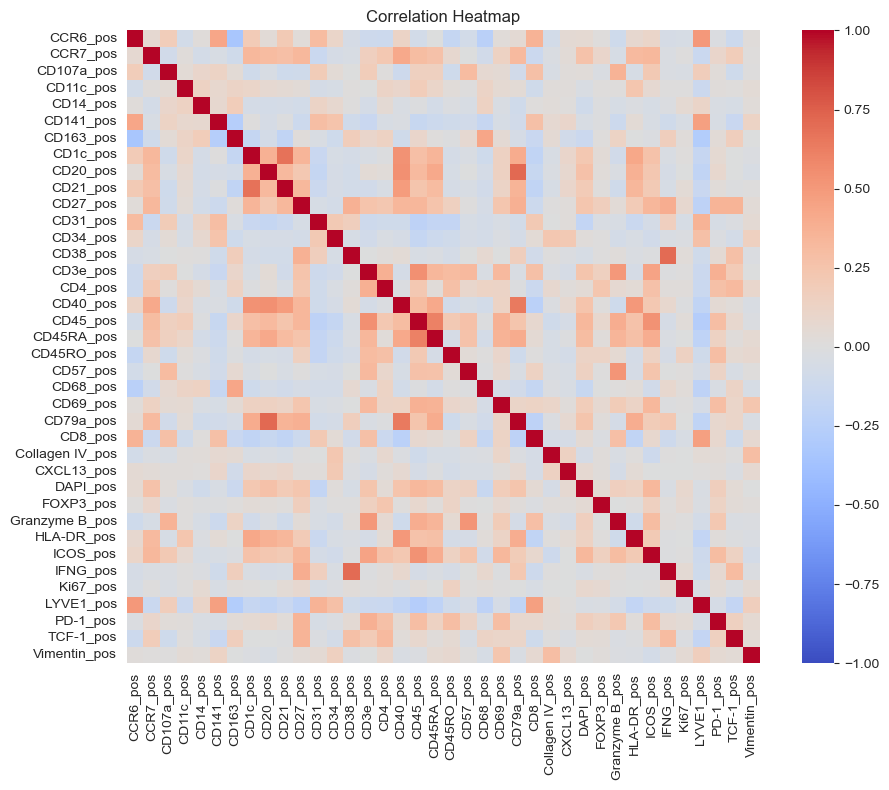

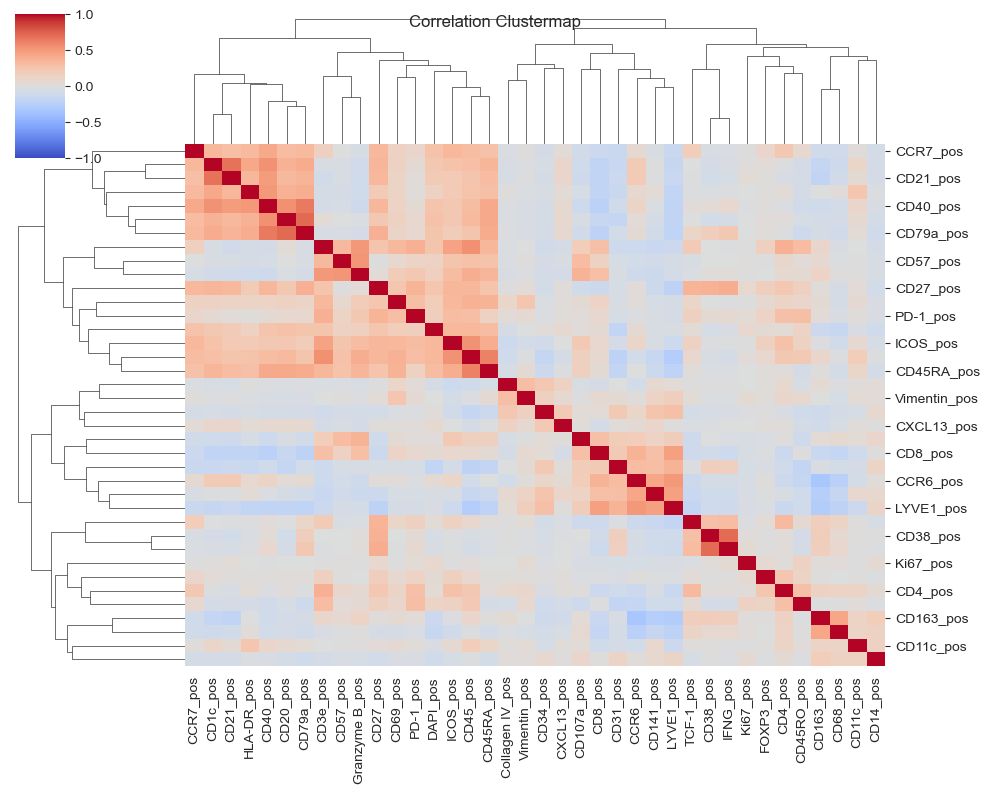

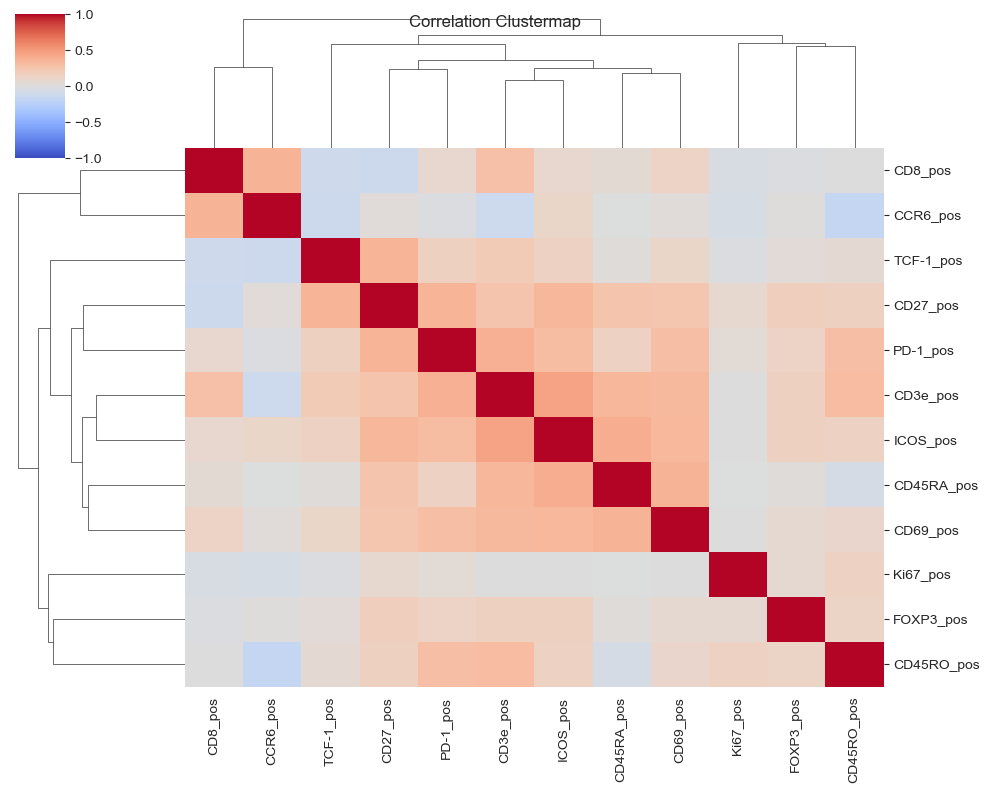

,CD3e_pos,FOXP3_pos,ICOS_pos,CD8_pos,CD45RO_pos,CD45RA_pos,TCF-1_pos,CD27_pos,CD69_pos,PD-1_pos,CCR6_pos,Ki67_pos
CD3e_pos,1.000000,0.153951,0.450470,0.280021,0.311151,0.338088,0.202443,0.256712,0.327023,0.382186,-0.109554,0.005302
FOXP3_pos,0.153951,1.000000,0.149288,-0.022901,0.123138,0.018256,0.037081,0.171375,0.066529,0.129307,0.009674,0.062699
ICOS_pos,0.450470,0.149288,1.000000,0.085457,0.139532,0.397815,0.137127,0.337432,0.328643,0.304282,0.108314,0.000002
CD8_pos,0.280021,-0.022901,0.085457,1.000000,0.002472,0.054154,-0.108856,-0.123892,0.126285,0.084241,0.363156,-0.044916
CD45RO_pos,0.311151,0.123138,0.139532,0.002472,1.000000,-0.059174,0.059110,0.150152,0.100861,0.289558,-0.171002,0.144418
CD45RA_pos,0.338088,0.018256,0.397815,0.054154,-0.059174,1.000000,0.020917,0.256077,0.363026,0.133441,-0.001246,-0.006245
TCF-1_pos,0.202443,0.037081,0.137127,-0.108856,0.059110,0.020917,1.000000,0.355939,0.103681,0.149353,-0.118365,-0.017677
CD27_pos,0.256712,0.171375,0.337432,-0.123892,0.150152,0.256077,0.355939,1.000000,0.241318,0.355342,0.027700,0.074015
CD69_pos,0.327023,0.066529,0.328643,0.126285,0.100861,0.363026,0.103681,0.241318,1.000000,0.295766,0.025856,0.000778
PD-1_pos,0.382186,0.129307,0.304282,0.084241,0.289558,0.133441,0.149353,0.355342,0.295766,1.000000,-0.022725,0.040551


In [11]:
from scripts.plotting import marker_correlation_plots

#All markers
marker_correlation_plots(adata)

#All markers with cluster map
marker_correlation_plots(adata, use_clustermap=True)
# Clustermap uses UPGMA algorithm via scipy.cluster.hierarchy.linkage(method = "average")

# Select markers, for example T-cell markers:
tc_markers = ["CD3e", "FOXP3", "ICOS", "CD8", "CD45RO", "CD45RA", "TCF-1", "CD27", "CD69", "PD-1", "CCR6", "GranzymeB", "Ki67"]

# Plot
marker_correlation_plots(adata, markers=tc_markers, use_clustermap=True)

**Spatial marker visualization**

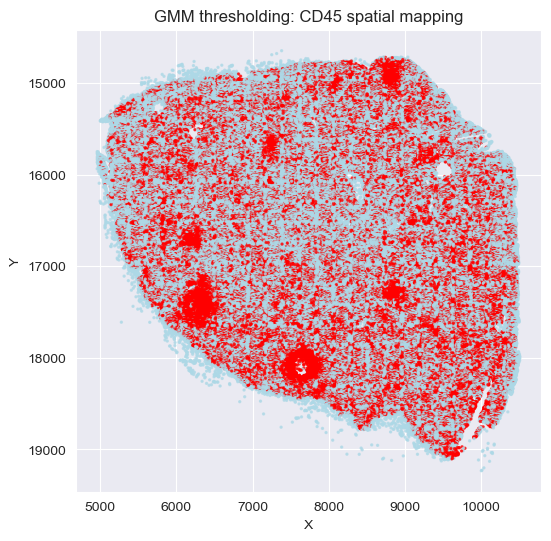

In [15]:
from scripts.spatialmapping import plot_spatial_marker

# One marker, here CD45+ vs CD45-
plot_spatial_marker(adata, "CD45", thresholded=True, title_prefix="GMM thresholding: ", color_hi="red", color_lo="lightblue")

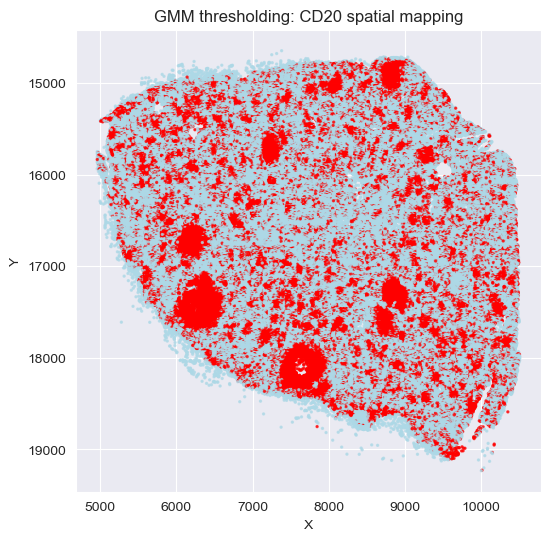

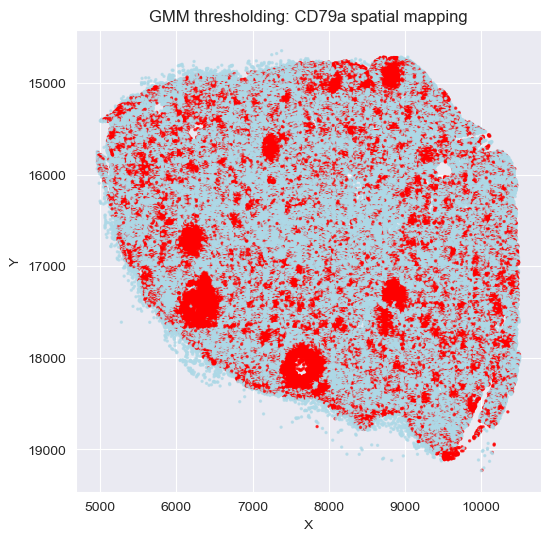

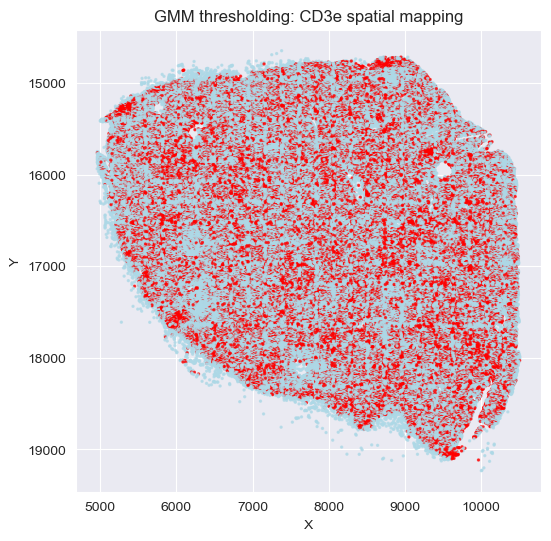

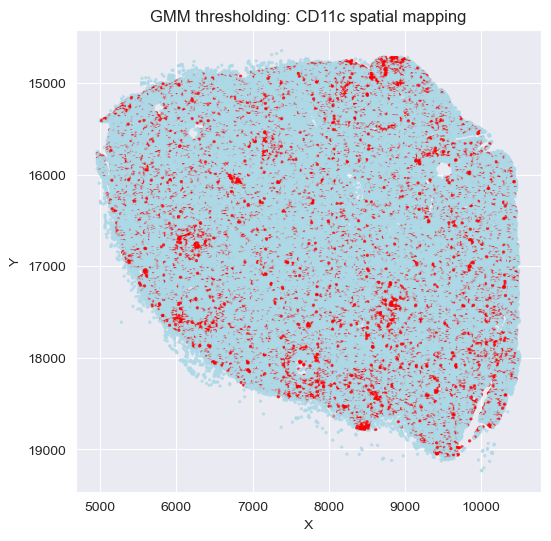

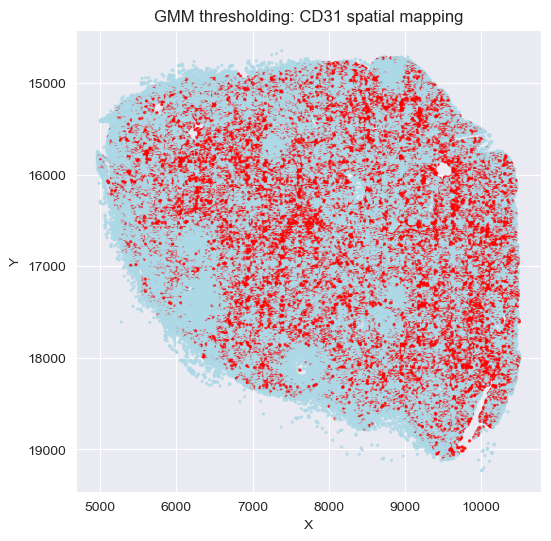

In [34]:
from scripts.spatialmapping import plot_spatial_marker

# Some more markers
plot_spatial_marker(adata, "CD20", thresholded=True, title_prefix="GMM thresholding: ", color_hi="red", color_lo="lightblue")

plot_spatial_marker(adata, "CD79a", thresholded=True, title_prefix="GMM thresholding: ", color_hi="red", color_lo="lightblue")

plot_spatial_marker(adata, "CD3e", thresholded=True, title_prefix="GMM thresholding: ", color_hi="red", color_lo="lightblue")

plot_spatial_marker(adata, "CD11c", thresholded=True, title_prefix="GMM thresholding: ", color_hi="red", color_lo="lightblue")

plot_spatial_marker(adata, "CD31", thresholded=True, title_prefix="GMM thresholding: ", color_hi="red", color_lo="lightblue")

# Manual cell type annotation

In [16]:
from scripts.celltype_rules import assign_cell_types

# Annotate all cells
adata = assign_cell_types(adata)

Dropped cells (no CD45 info): 0
CD45+ (Immune): 77090
CD45- (Non-Immune): 110007
T-cells: 27006
B-cells: 20398
Myeloid: 2950
Immune_Unclassified: 26897
Endothelial: 65236
Stromal: 13244
Non-Immune_Unclassified: 34640
T-cell subtypes summary:
    Treg: 1
    TfH_like: 7
    Th17_like: 17
    CD4_T: 3040
    CD8_T: 16170
    Stem_like_memory_T: 0
    Naive_T: 1237
    Tissue_Resident_T: 6295
    T_Unclassified: 239
B-cell subtypes summary:
    Memory_B: 10407
    Plasma_like: 194
    GC_like_B: 428
    Follicular_like_B: 972
    Activated_B: 4504
    B_Unclassified: 3732
Myeloid/APC subtypes summary:
    Monocyte/Macrophage: 2593
    cDC1: 176
    cDC2: 7
    Myeloid_Unclassified: 174
Non-immune subtypes summary:
    Endothelial: 1049
    Lymphatic_Endothelial: 41889
    Fibroblast: 4725
    FDC: 117
    Stromal_Unclassified: 43205
    Basement Membrane: 19022


**Spatial cell type visualization**

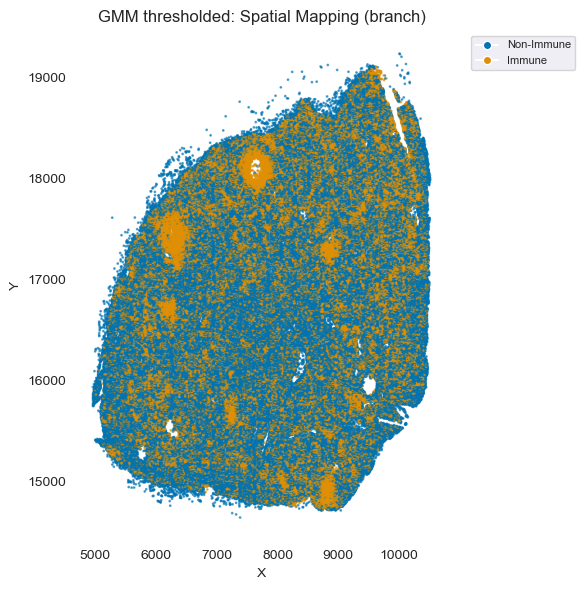

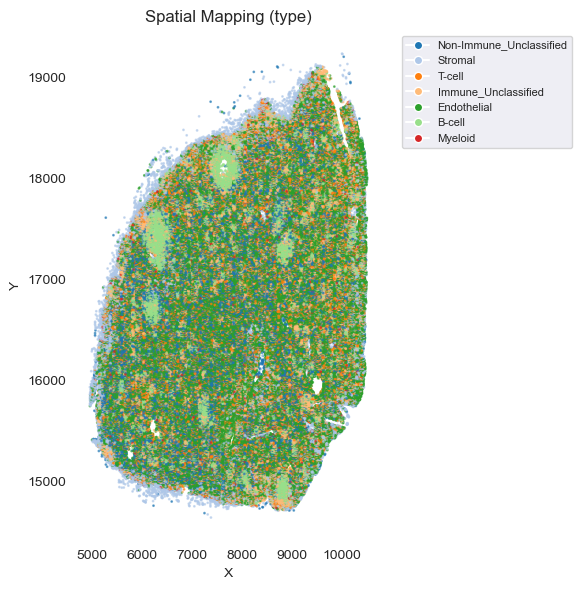

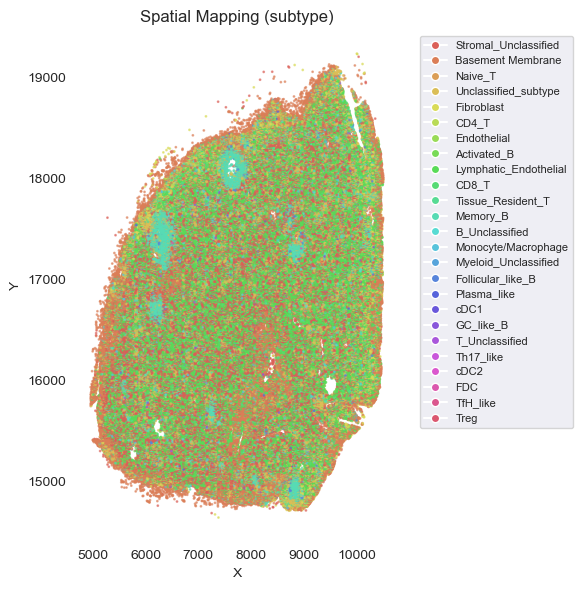

In [20]:
from scripts.spatialmapping import plot_spatial_cell_types

# Plot the branch level (immune/non-immune)
fig = plot_spatial_cell_types(
    adata,
    level="branch",
    size=1,
    alpha=0.6,
    invert_y=False,
    title_prefix=f"GMM thresholded: ",
    save = False
)

# Plot the cell type level
fig_type = plot_spatial_cell_types(
    adata,
    level="type",
    size=1,
    alpha=0.6,
    invert_y=False,
    save = False
)

# Plot the cell subtype level
fig_subtype = plot_spatial_cell_types(
    adata,
    level="subtype",
    size=1,
    alpha=0.6,
    invert_y=False,
    save = False
)

**You can plot selected cell types/subtypes to avoid cluttering the spatial plots. Use the names as written here:**

**Cell types:**

'Endothelial', 'Stromal', 'Non-Immune_Unclassified'
'T-cell', 'B-cell', 'Myeloid', 'Immune_Unclassified'

**Cell subtypes:**

'Endothelial', 'Lymphatic_Endothelial', 'Fibroblast', 'FDC', 'Stromal_Unclassified', 'Basement Membrane'
'Monocyte/Macrophage', 'cDC1', 'cDC2', 'Myeloid_Unclassified'
'Memory_B', 'Plasma_like', 'GC_like_B', 'Follicular_like_B', 'Activated_B', 'B_Unclassified'
'Treg', 'TfH_like', 'Th17_like', 'CD4_T', 'CD8_T', 'Stem_like_memory_T', 'Naive_T', 'Tissue_Resident_T', 'T_Unclassified'

Saved to /Users/magnusberg/Documents/Internships/fall 2025/IHOPE_SpatialProteomics/results/figures/spatial_subset_type.png


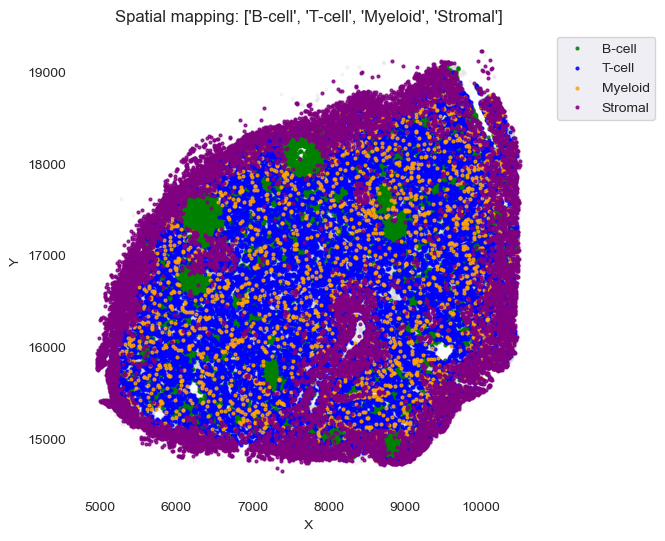

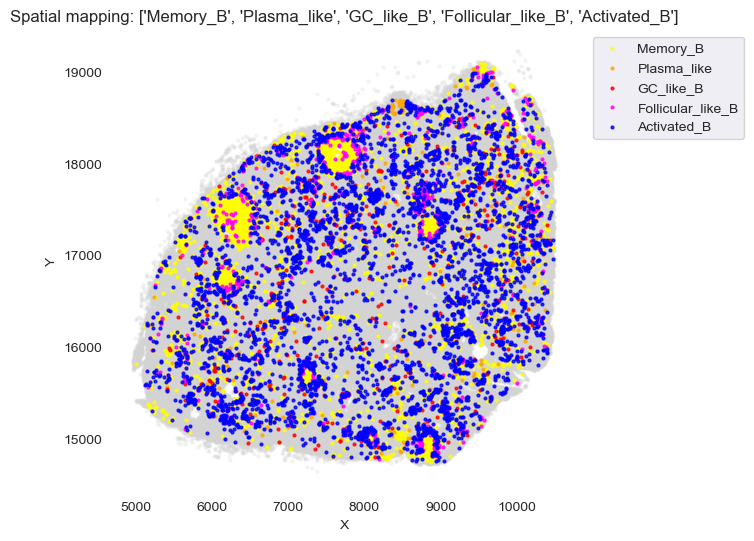

In [48]:
from scripts.spatialmapping import plot_spatial_subset

plot_spatial_subset(
    adata,
    level="type",
    include=["B-cell", "T-cell", "Myeloid", "Stromal"],
    colors={"B-cell": "green",
            "Myeloid": "orange",
            "Stromal": "purple",
            "T-cell": "blue"},
    save = True
)

plot_spatial_subset(
    adata,
    level="subtype",
    include=["Memory_B", "Plasma_like", "GC_like_B", "Follicular_like_B", "Activated_B"],
    colors={"Memory_B": "yellow", "Plasma_like": "orange", "GC_like_B": "red", "Follicular_like_B": "magenta", "Activated_B": "blue"},
    save = False
)

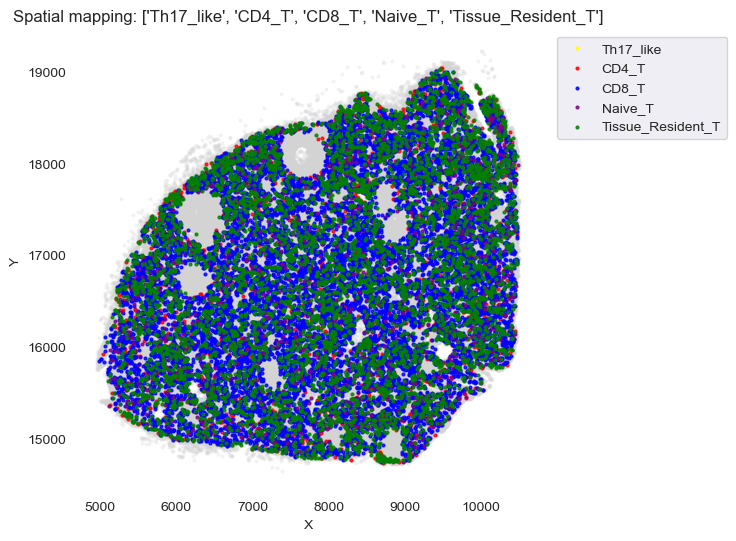

In [23]:
plot_spatial_subset(
    adata,
    level="subtype",
    include=['Th17_like', 'CD4_T', 'CD8_T', 'Naive_T', 'Tissue_Resident_T'],
    colors={"Th17_like": "yellow", "CD4_T": "red", "CD8_T": "blue", "Naive_T": "purple", "Tissue_Resident_T": "green"},
    save = False
)

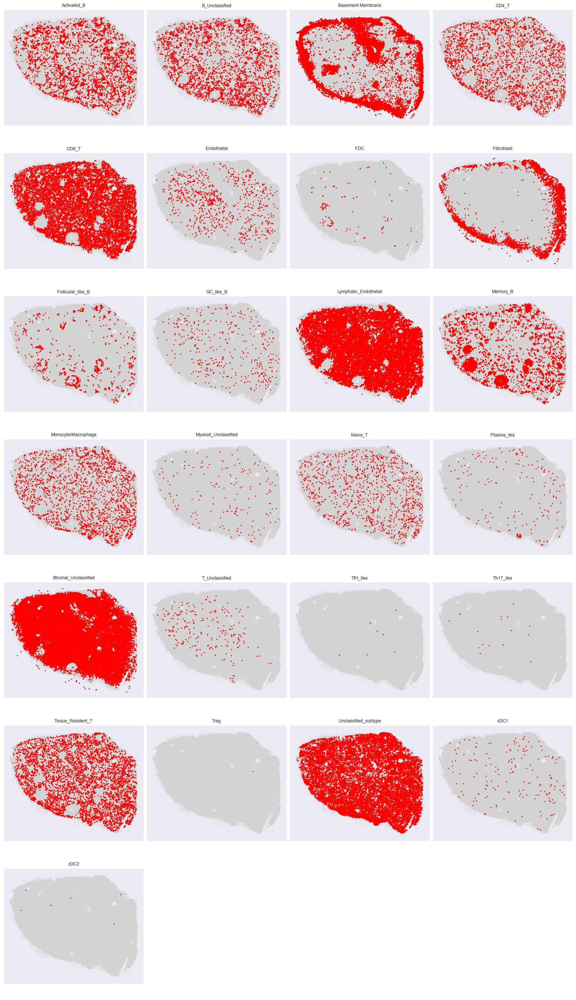

In [36]:
# To visualize all subtypes one by one:

# Annotation level to plot
level = "subtype"

# Data
coords = adata.obsm["spatial"]
x, y = coords[:, 0], coords[:, 1]
vals = adata.obs[level].astype(str)

subtypes = sorted(vals.unique())

# Grid layout
n_cols = 4
n_rows = math.ceil(len(subtypes) / n_cols)

fig, axes = plt.subplots(
    n_rows, n_cols,
    figsize=(4 * n_cols, 4 * n_rows),
    constrained_layout=True
)

axes = axes.flatten()

for ax, subtype in zip(axes, subtypes):
    mask = vals == subtype

    # Background cells
    ax.scatter(
        x[~mask], y[~mask],
        c="lightgrey",
        s=2,
        alpha=0.1
    )

    # Highlighted subtype
    ax.scatter(
        x[mask], y[mask],
        c="red",
        s=2,
        alpha=0.9
    )

    ax.set_title(subtype, fontsize=9)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.invert_yaxis()
    ax.set_aspect("equal")

# Turn off unused axes
for ax in axes[len(subtypes):]:
    ax.axis("off")

plt.show()

# Clustering with PCA + Leiden + UMAP
Adapted from Natthaphong Kaewkam 2025

In [4]:
# If you need to load the anndata file:
adata = anndata.read_h5ad("../data/processed/anndata/banksy_adadata_backup_IHOPE26.h5ad")

In [5]:
print("adata.obs columns: ")
print(list(adata.obs.columns))


adata.obs columns: 
['Object ID', 'Centroid X µm', 'Centroid Y µm', 'Area µm^2', 'Nucleus/Cell area ratio', 'x', 'y', 'raw_CCR6_pos', 'raw_CCR7_pos', 'raw_CD107a_pos', 'raw_CD11c_pos', 'raw_CD14_pos', 'raw_CD141_pos', 'raw_CD163_pos', 'raw_CD1c_pos', 'raw_CD20_pos', 'raw_CD21_pos', 'raw_CD27_pos', 'raw_CD31_pos', 'raw_CD34_pos', 'raw_CD38_pos', 'raw_CD3e_pos', 'raw_CD4_pos', 'raw_CD40_pos', 'raw_CD45_pos', 'raw_CD45RA_pos', 'raw_CD45RO_pos', 'raw_CD57_pos', 'raw_CD68_pos', 'raw_CD69_pos', 'raw_CD79a_pos', 'raw_CD8_pos', 'raw_Collagen IV_pos', 'raw_CXCL13_pos', 'raw_DAPI_pos', 'raw_FOXP3_pos', 'raw_Granzyme B_pos', 'raw_HLA-DR_pos', 'raw_ICOS_pos', 'raw_IFNG_pos', 'raw_Ki67_pos', 'raw_LYVE1_pos', 'raw_PD-1_pos', 'raw_TCF-1_pos', 'raw_Vimentin_pos', 'banksy_domain', 'branch', 'type', 'subtype', 'CCR6_pos', 'CCR7_pos', 'CD107a_pos', 'CD11c_pos', 'CD14_pos', 'CD141_pos', 'CD163_pos', 'CD1c_pos', 'CD20_pos', 'CD21_pos', 'CD27_pos', 'CD31_pos', 'CD34_pos', 'CD38_pos', 'CD3e_pos', 'CD4_pos', 

In [6]:
print("adata.obsm keys: ")
print(list(adata.obsm.keys()))

adata.obsm keys: 
['spatial']


In [7]:
print("adata.uns keys: ")
print(list(adata.uns.keys()))

adata.uns keys: 
['banksy_domain_colors', 'dendrogram_banksy_domain', 'normalization', 'rank_genes_groups', 'sample_id', 'thresholds']


/Users/magnusberg/.miniconda3/envs/ihopespatial/lib/python3.10/site-packages/scanpy/preprocessing/_pca/__init__.py:384: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm[key_obsm] = x_pca


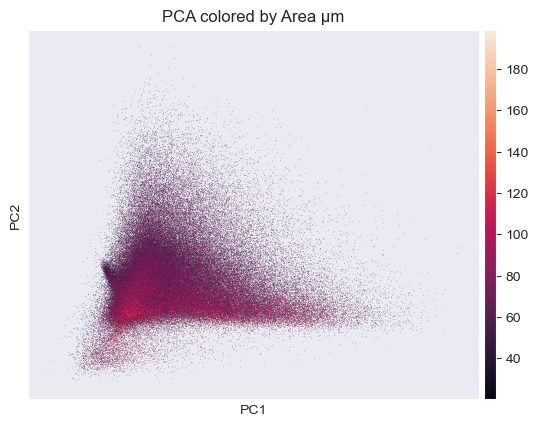

Error processing line 1 of /Users/magnusberg/.miniconda3/envs/ihopespatial/lib/python3.10/site-packages/distutils-precedence.pth:

  Traceback (most recent call last):
    File "/Users/magnusberg/.miniconda3/envs/ihopespatial/lib/python3.10/site.py", line 195, in addpackage
      exec(line)
    File "<string>", line 1, in <module>
  ModuleNotFoundError: No module named '_distutils_hack'

Remainder of file ignored
/Users/magnusberg/.miniconda3/envs/ihopespatial/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/var/folders/30/65bd79gx1xq3x7x5jng74jrh0000gn/T/ipykernel_21891/3881861853.py:15: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work w

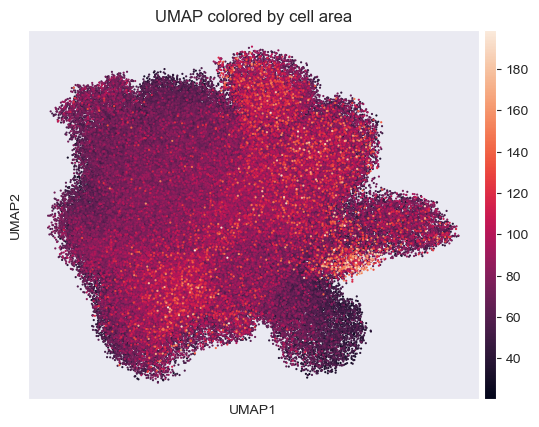

In [29]:
# Compute principal components for dimensionality reduction
sc.tl.pca(adata)

# Visualize PCA colored by cell area (to see if area explains most variation)
sc.pl.pca(adata, color='Area µm^2', title='PCA colored by Area µm')

# Construct k-nearest neighbor graph using PCA representation
sc.pp.neighbors(adata, n_neighbors=10, use_rep='X_pca')

# Compute UMAP embedding for nonlinear dimensionality reduction
sc.tl.umap(adata, min_dist=0.5, spread=0.3)

# Perform Leiden clustering on the neighbor graph
# adata.obs['leiden'] will contain the Leiden clusters
sc.tl.leiden(adata, resolution=0.5)

# Visualize UMAP colored by cell area
sc.pl.umap(adata, color='Area µm^2', title='UMAP colored by cell area', size=10)

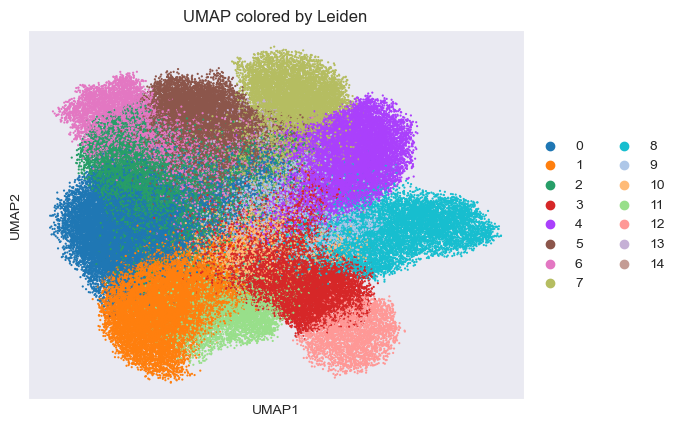

In [30]:
# And colored by Leiden cluster
sc.pl.umap(adata, color='leiden', title='UMAP colored by Leiden', size=10)

In [31]:
# Get and display cell counts per cluster
print("\nCell Counts per Cluster: ")
# Use value_counts() to get the number of cells in each cluster
# Sort by index
cluster_counts = adata.obs['leiden'].value_counts().sort_index(key=lambda x: pd.to_numeric(x, errors='ignore'))
print("The following table shows the number of cells in each cluster:")
print(cluster_counts.to_string())


Cell Counts per Cluster: 
The following table shows the number of cells in each cluster:
leiden
0     26185
1     24729
2     22272
3     21720
4     20450
5     14538
6     11520
7     11133
8     10120
9      8704
10     6785
11     4990
12     2953
13      842
14      156


/var/folders/30/65bd79gx1xq3x7x5jng74jrh0000gn/T/ipykernel_21891/1093390204.py:5: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  cluster_counts = adata.obs['leiden'].value_counts().sort_index(key=lambda x: pd.to_numeric(x, errors='ignore'))


PC loadings

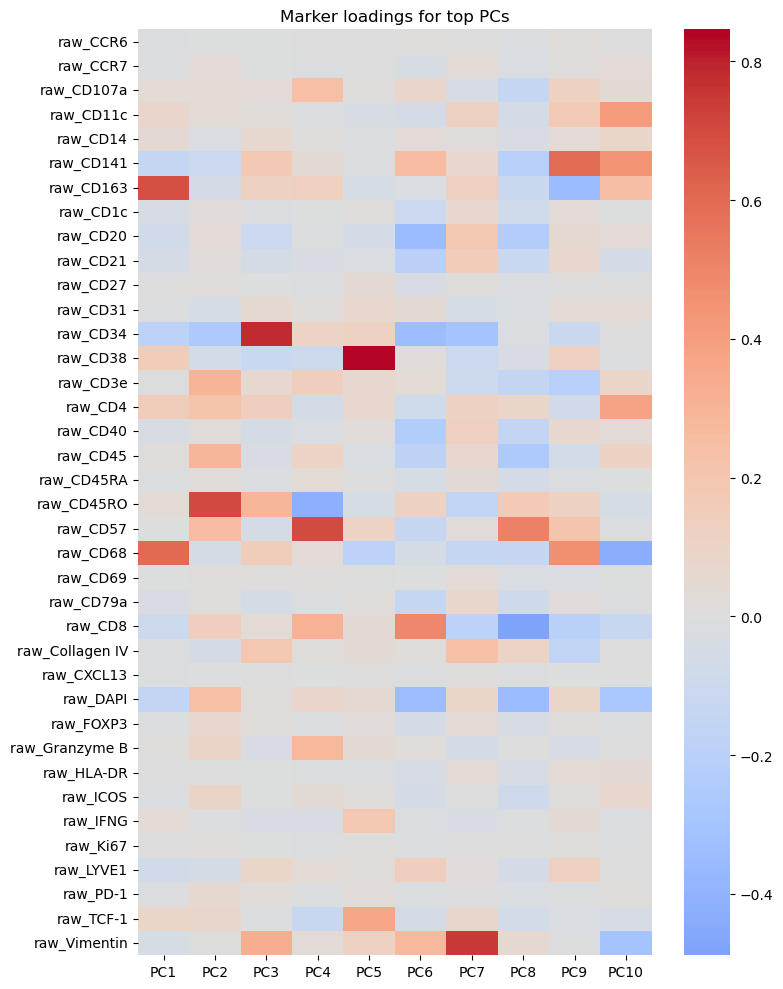

In [38]:
loadings = pd.DataFrame(
    adata.varm['PCs'],
    index=adata.var_names,
    columns=[f'PC{i+1}' for i in range(adata.varm['PCs'].shape[1])]
)

# Look at top PCs only
top_pcs = loadings.iloc[:, :10]

plt.figure(figsize=(8, 10))
sns.heatmap(
    top_pcs,
    cmap='coolwarm',
    center=0
)
plt.title('Marker loadings for top PCs')
plt.tight_layout()
plt.show()


In [40]:
# Numeric summary
for pc in range(10):
    print(f"\nPC{pc+1} top contributors:")
    print(loadings.iloc[:, pc].abs().sort_values(ascending=False).head(10))



PC1 top contributors:
raw_CD163    0.680574
raw_CD68     0.602391
raw_CD34     0.186173
raw_CD38     0.158507
raw_CD4      0.148680
raw_DAPI     0.144434
raw_CD141    0.139301
raw_CD8      0.100418
raw_TCF-1    0.094019
raw_CD11c    0.083490
Name: PC1, dtype: float64

PC2 top contributors:
raw_CD45RO        0.704806
raw_CD3e          0.302898
raw_CD45          0.293274
raw_CD57          0.255976
raw_CD34          0.254496
raw_DAPI          0.239234
raw_CD4           0.217065
raw_CD8           0.143271
raw_CD141         0.102674
raw_Granzyme B    0.099458
Name: PC2, dtype: float64

PC3 top contributors:
raw_CD34           0.782733
raw_Vimentin       0.332849
raw_CD45RO         0.291397
raw_Collagen IV    0.199496
raw_CD141          0.181610
raw_CD68           0.149531
raw_CD4            0.147328
raw_CD38           0.121965
raw_CD163          0.118143
raw_CD20           0.105600
Name: PC3, dtype: float64

PC4 top contributors:
raw_CD57          0.693913
raw_CD45RO        0.418658
raw_CD

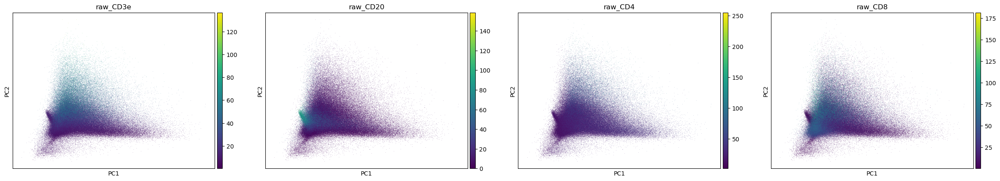

In [41]:
sc.pl.pca(adata, color=['raw_CD3e', 'raw_CD20', 'raw_CD4', 'raw_CD8'])

Spatial visualization of clusters


Plotting spatial distribution of clusters... 


/var/folders/30/65bd79gx1xq3x7x5jng74jrh0000gn/T/ipykernel_21891/3056723705.py:8: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata,


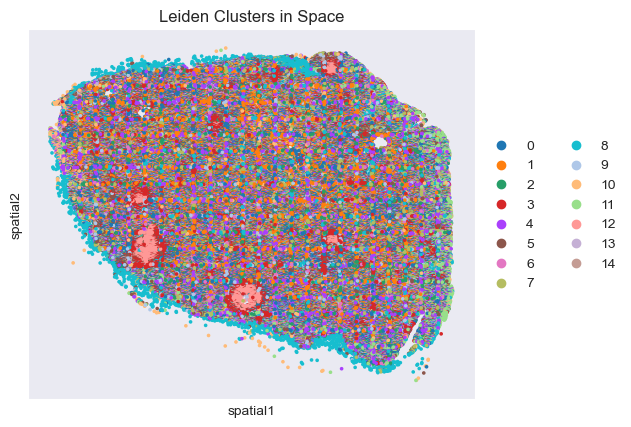


Simplified cluster characterization complete.


In [32]:
print("\nPlotting spatial distribution of clusters... ")
if 'spatial' in adata.obsm and 'leiden' in adata.obs.columns:
    spatial_colors = ['leiden']
    # Add annotated types
    if 'cell_type_annotation' in adata.obs.columns:
        spatial_colors.append('cell_type_annotation')

    sc.pl.spatial(adata,
                  color=spatial_colors,
                  spot_size=50, # Adjust spot_size
                  title=['Leiden Clusters in Space', 'Annotated Types in Space'][:len(spatial_colors)])
else:
    print("Skipping spatial plot ('spatial' coords or 'leiden' column missing).")

Save anndata object with PCA, neighbors, UMAP, and Leiden clusters if you're content:

In [33]:
adata.write_h5ad("../data/processed/anndata/IHOPE26_adata_with_leiden_GMM_raw.h5ad")

You can now load the data anytime:

In [8]:
# If you need to load the anndata file:
adata = anndata.read_h5ad("../data/processed/anndata/IHOPE26_adata_with_leiden_GMM_raw.h5ad")

**Exploring specific markers and clusters**

See names below:

In [9]:
print(adata.var_names)

Index(['raw_CCR6', 'raw_CCR7', 'raw_CD107a', 'raw_CD11c', 'raw_CD14',
       'raw_CD141', 'raw_CD163', 'raw_CD1c', 'raw_CD20', 'raw_CD21',
       'raw_CD27', 'raw_CD31', 'raw_CD34', 'raw_CD38', 'raw_CD3e', 'raw_CD4',
       'raw_CD40', 'raw_CD45', 'raw_CD45RA', 'raw_CD45RO', 'raw_CD57',
       'raw_CD68', 'raw_CD69', 'raw_CD79a', 'raw_CD8', 'raw_Collagen IV',
       'raw_CXCL13', 'raw_DAPI', 'raw_FOXP3', 'raw_Granzyme B', 'raw_HLA-DR',
       'raw_ICOS', 'raw_IFNG', 'raw_Ki67', 'raw_LYVE1', 'raw_PD-1',
       'raw_TCF-1', 'raw_Vimentin'],
      dtype='object')


As a diagnostic, plot some key cell type markers colored Leiden clusters. By looking at e.g. CD20 and CD3e colored by Leiden clusters, you may get an idea of what was captured in terms of those markers.

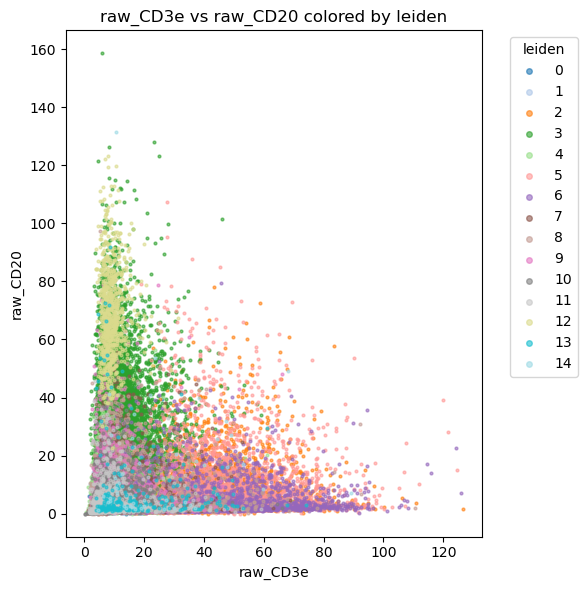

In [34]:
from scripts.plotting import plot_marker_pair_by_leiden

plot_marker_pair_by_leiden(
    adata,
    marker_x='raw_CD3e',
    marker_y='raw_CD20'
)

Violin plot of marker distribution in clusters

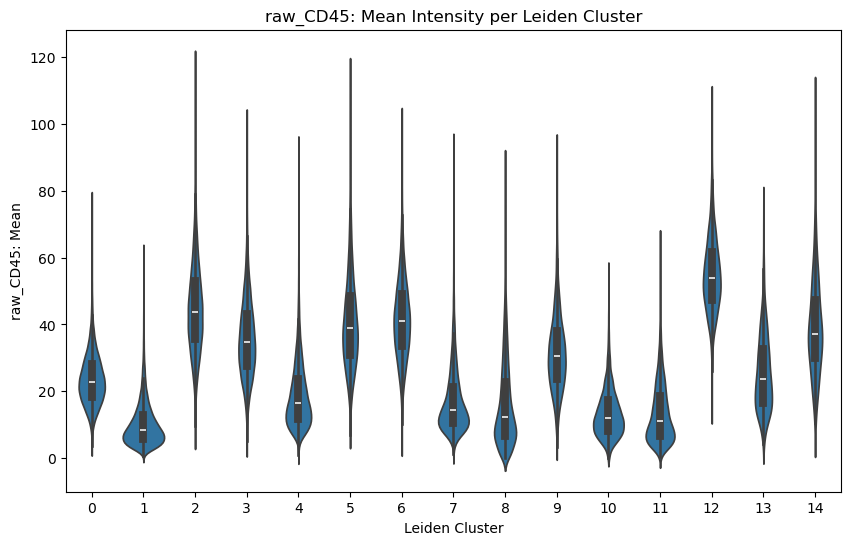

In [20]:
# Marker to assess across Leiden clusters
marker = 'raw_CD45'

# Proceed only if the marker is present in the feature table
if marker in adata.var_names:
    # Extract per-cell DAPI intensity values
    marker_values = adata[:, marker].X.flatten()

    # Use Leiden assignments as grouping variable
    clusters = adata.obs['leiden']

    # Assemble expression and cluster labels for downstream visualization
    df_violin = pd.DataFrame({marker: marker_values, 'leiden': clusters})

    plt.figure(figsize=(10, 6))

    # Compare marker intensity distributions across clusters
    sns.violinplot(x='leiden', y=marker, data=df_violin, inner='box')

    plt.title(f'{marker}: Mean Intensity per Leiden Cluster')
    plt.xlabel('Leiden Cluster')
    plt.ylabel(f'{marker}: Mean')
    plt.show()
else:
    print(f"{marker} not found in adata.var_names.")


Violin plot of cell area in clusters

In [ ]:
sc.pl.violin(adata, ['Area µm^2'], groupby='leiden', rotation=90)
plt.title('Distribution of Cell Area per Leiden Cluster')
plt.show()

Spatial distribution of selected clusters

/var/folders/30/65bd79gx1xq3x7x5jng74jrh0000gn/T/ipykernel_96467/3891438656.py:8: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata_subset, color='leiden', spot_size=50, title='Spatial Distribution of Selected Clusters')
/Users/magnusberg/.miniconda3/envs/ihopespatial/lib/python3.10/site-packages/scanpy/plotting/_utils.py:465: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[f"{value_to_plot}_colors"] = colors_list


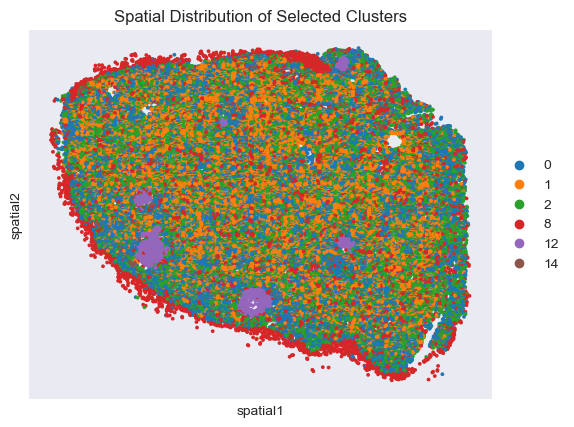

In [105]:
# Specify clusters to plot
clusters_to_plot = ['2', '0', '12', '1', '8', '14']

# Filter the anndata object for the desired clusters
adata_subset = adata[adata.obs['leiden'].isin(clusters_to_plot)]

# Plot the spatial distribution for the filtered clusters
sc.pl.spatial(adata_subset, color='leiden', spot_size=50, title='Spatial Distribution of Selected Clusters')

**Cluster annotation**

Adds:

adata.obs['celltype_major'] → major lineage annotation for each cell

adata.obs['celltype_fine'] → fine-grained subtype annotation

By comparing the intensities of individual markers within clusters, you can assign cell type identities to the clusters. This requires knowledge of cell types and canonical immunology markers. You could just visually inspect the heatmap. A more stringent option is to assign percentile-based marker positivity. It is also important to consider that the clustering parameters and input data will change the cluster contents. This is just one example of a workflow.

**Visual method**

/Users/magnusberg/Documents/Internships/fall 2025/IHOPE_SpatialProteomics/scripts/plotting.py:203: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


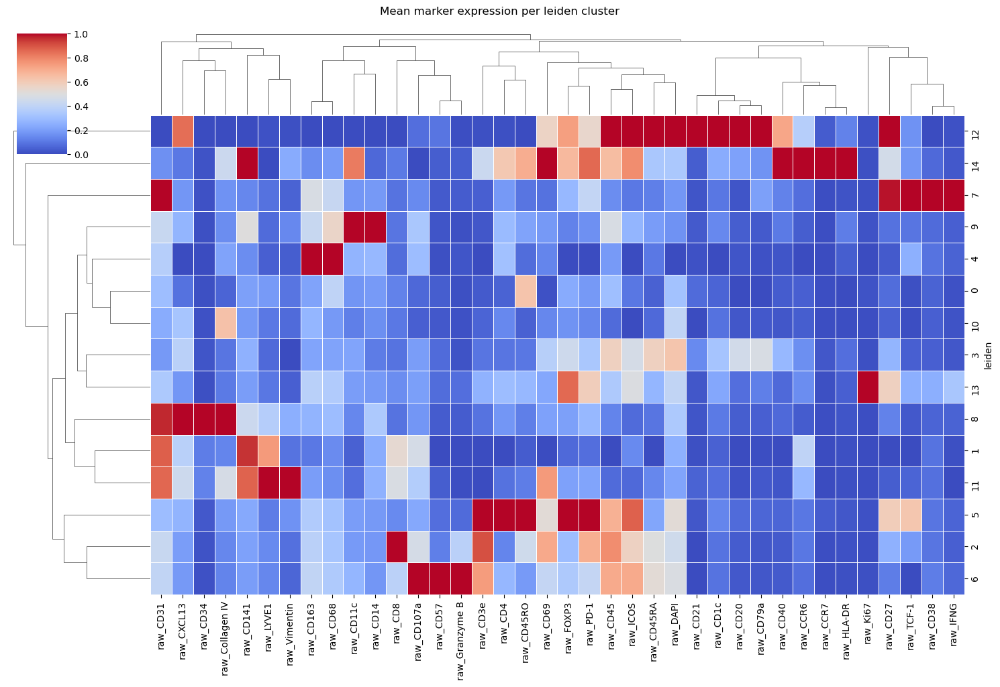

In [37]:
# Heatmap
from scripts.plotting import plot_cluster_marker_heatmap

plot_cluster_marker_heatmap(adata)

# Or if you want absolute values:
# plot_cluster_marker_heatmap(adata, scale=None)

# If saving data as csv:
#df = plot_cluster_marker_heatmap(adata, return_data=True)
#df.to_csv("cluster_marker_heatmap.csv")

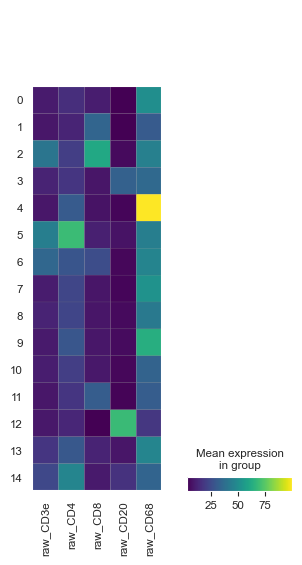

In [122]:
# Explore markers of interest: mean expression within clusters
markers = ['raw_CD3e', 'raw_CD4', 'raw_CD8', 'raw_CD20', 'raw_CD68']

sc.pl.matrixplot(adata, var_names=markers, groupby='leiden', cmap='viridis')


/var/folders/30/65bd79gx1xq3x7x5jng74jrh0000gn/T/ipykernel_96467/760175445.py:9: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata_subset, color='leiden', spot_size=50, title='Spatial Distribution of Selected Clusters')


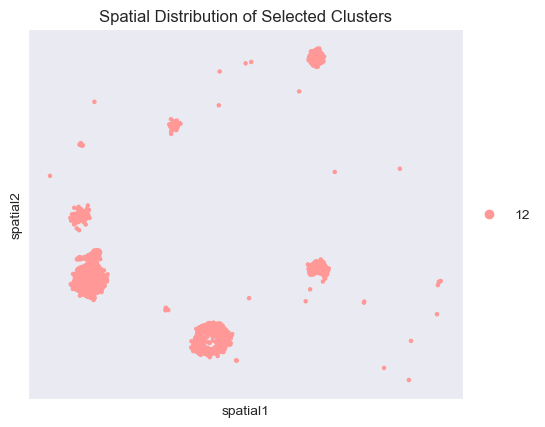

In [126]:
# Spatial visualization of a cluster:
# Specify cluster to plot
cluster_to_plot = ['12']

# Filter the anndata object for the desired clusters
adata_subset = adata[adata.obs['leiden'].isin(cluster_to_plot)]

# Plot the spatial distribution for the filtered clusters
sc.pl.spatial(adata_subset, color='leiden', spot_size=50, title='Spatial Distribution of Selected Clusters')

In [127]:
from scripts.cluster_annotation import summarize_single_cluster
top_markers_0 = summarize_single_cluster(adata, cluster_id='12')
print(top_markers_0)


raw_DAPI      94.559205
raw_CD21      72.415887
raw_CD20      68.384939
raw_CD40      55.018749
raw_CD45      54.880639
raw_CD1c      30.730400
raw_CD79a     28.678427
raw_ICOS      21.627667
raw_TCF-1     21.389875
raw_CD107a    18.594849
dtype: float64


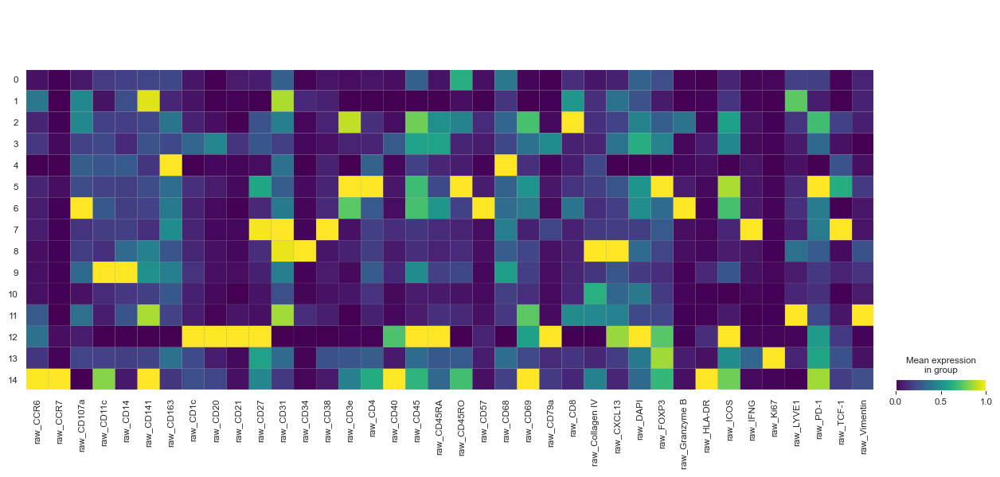

In [48]:
# Overview of all markers average expression across clusters:
# Matrix plot: average expression per cluster
sc.pl.matrixplot(
    adata,
    var_names=adata.var_names,
    groupby='leiden',
    cmap='viridis',
    standard_scale='var'  # scales each marker across clusters to 0–1
)


**Summary (visual inspection)**

0: Positive: CD45RO. Negative: most others. Ambiguous: CD45, CD68

Suggestion: T-cell, potential memory/atypical/noise as it lacks CD3e.

1: Positive: CD141, CD31, LYVE1, Slightly positive: CD107a, 8. Ambiguous: CXCL13. Negative: most others

Suggestion: Stromal, lymphatic endothelial (examine CXCL13, possible follicular microenvironment influence)

2: Positive: CD8, CD3e, CD69, CD45, PD-1. Negative: CD79a, CD20, CD21, CCR7, HLA-DR, Ki67. Ambiguous: CD107a, CD45RA, CD45RO

Suggestion: T-cell, CD8 resident/activated.
Notes: non-cytotoxic with PD-1 positivity

3: Positive: CD45 (pan-leukocyte), CD45RA, ICOS. Negative: CCR7, CD34, Granzyme B, IFNG, Ki67, TCF-1, Vimentin. Ambiguous: CD107a

Suggestion: T-cell atypical (CD3e negative) Tfh / activated CD4 (lacking CD4...)
Notes: CD3e dropout, CD45RA+ CD45RO− pattern unusual, may be early activated or noise

4: Positive: CD163, CD68. Ambiguous: CD31. Negative: everything else

Suggestion: Myeloid, macrophages.
Notes: CD163+ CD68+; non-cytotoxic, tissue-resident

5: Positive: CD3e, CD4, CD45, CD45RO, FOXP3, PD-1, ICOS, CD27. Negative: CD21, CCR7, CD34, HLA-DR, Ki67

Suggestion: T-cell, Treg?
Notes: FOXP3+ memory phenotype, PD-1/ICOS+ suppressive lineage.

6: Positive: CD107a, CD57, Granzyme B, ICOS, CD45, CD3e. Negative: CCR7, CD20, CD21, CD34, CD40, CD79a, HLA-DR. Ambiguous: CD31

Suggestion: T-cell, cytotoxic effector (but lacking CD8...?)
Notes: terminally differentiated CD57+, Granzyme B+, CD8 should be present

7: Positive: CD27, CD31, CD38, IFNG, TCF-1. Negative: CCR7, CD21, CD20, CD34, Ki67, CD3e, CD57, CD69, CD8, Granzyme B, HLA-DR, LYVE-1, Vimentin. Ambiguous: PD-1

Suggestion: T-cell, atypical (lacks CD3e) but Th1-like (IFNG without Granzyme B, TCF-1 presence)
Look up TCF-1⁺ IFNG⁺ “stem-like” or progenitor-effector T cells.
Notes: Progenitor-like/stem-like Th1 T cells, TCF-1+ IFNG+, non-cytotoxic, CD3e dropout.

8: Positive: CD34, CD31, Collagen IV, CXCL13. Negative: CCR6, CCR7, CD21, CD20, CD38, CD40, CD57, CD79a, Granzyme B, HLA-DR, Ki67, TCF-1. Ambiguous: CD141, CD14.

Suggestion: Stromal, FDC (CXCL13) or just stromal.
Notes: Non-hematopoietic stromal organizer cells of germinal centers, CXCL13+ Collagen IV+ CD31+, non-hematopoietic

9: Positive: CD11c, CD14. Negative: CCR6, CCR7, CD20, CD21, CD34, CD3e, CD57, CD79a, Granzyme B, Ki67, IFNG. Ambiguous: CD31, CD141, CD45, CD68.

Suggestion: Myeloid, antigen-presenting/monocyte-like.
Notes: Non-cytotoxic, non-proliferative myeloid cells, maybe monocyte-derived APCs

10: Positive: Collagen (weak). Negative: all other markers.

Suggestion: Stromal, acellular collagenous regions.

11: Positive: LYVE1, Vimentin, CD69 (low), CD31, CD141. Ambiguous: CD107a, CD8, Collagen IV, CXCL13. Negative: all other markers.

Suggestion: Stromal/endothelial, lymphatic endothelial.
Notes: Non-hematopoietic stromal cells; likely lymphatic vessels or sinus-lining cells

12: Positive: CD11c, CD20, CD21, CD27, CD45, CD45RA, CD79a, DAPI, ICOS, FOXP3 (low), CXCL13 (low). Negative: Vimentin, LYVE1, Ki67, IFNG, Granzyme B, Collagen IV, CD8, CD68, CD45RO, CD4, and almost everything else. Ambiguous: PD-1.

Suggestion: B-cells, naive/resting. Low FOXP3/ICOS/CXCL13 probably from follicular microenvironment (subclusters??)
Notes: Low FOXP3/ICOS/CXCL13 likely reflects follicular microenvironment; predominantly naive B phenotype

13: Positive: Ki67, FOXP3. Negative: CCR7, CD21, CD20, CD34, CD40, Granzyme B, HLA-DR, Vimentin. Ambiguous: ICOS, PD-1, CD27. Note: very low CD3e.

Suggestion: T-cells, proliferating regulatory.
Notes: Ambiguous ICOS/PD-1/CD27 indicate activated/memory-like Treg features; low CD3e noise?

14: Positive: CCR6, CCR7, CD141, CD40, CD69, HLA-DR, ICOS, PD-1, CD45RO, CD4, CD11c. Negative: CD107a, CD14, CD21, CD34, CD38, CD57, Granzyme B, IFNG, Ki67, LYVE-1. Ambiguous: CD3e, CD27.

Suggestion: T-cells, activated memory CD4.
Notes: CCR6+ CCR7+ indicates lymph node homing; HLA-DR, ICOS, PD-1, CD69 indicate activation; CD11c/CD141 likely reflect APC interaction rather than myeloid identity

**Percentile-based method**

In [95]:
# Compute the mean expression per cluster
cluster_means = adata.to_df().groupby(adata.obs['leiden']).mean()

# Compute thresholds for each marker
# Option 1: 70th percentile per marker across clusters (like your colleague)
thresholds = cluster_means.quantile(0.7, axis=0)

# Build a binary matrix of positive markers
positive_matrix = cluster_means.ge(thresholds)

# Print positive markers per cluster
for cluster in positive_matrix.index:
    positives = positive_matrix.columns[positive_matrix.loc[cluster]].tolist()
    print(f"Cluster {cluster}: {positives}")

# Optional: view the binary matrix as a DataFrame
positive_matrix


/var/folders/30/65bd79gx1xq3x7x5jng74jrh0000gn/T/ipykernel_96467/1215868130.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_means = adata.to_df().groupby(adata.obs['leiden']).mean()


Cluster 0: ['raw_CD21', 'raw_CD45RO', 'raw_CD68', 'raw_Ki67', 'raw_LYVE1']
Cluster 1: ['raw_CCR6', 'raw_CD107a', 'raw_CD14', 'raw_CD141', 'raw_CD31', 'raw_CD34', 'raw_CD8', 'raw_CXCL13', 'raw_LYVE1']
Cluster 2: ['raw_CD107a', 'raw_CD163', 'raw_CD31', 'raw_CD38', 'raw_CD3e', 'raw_CD45', 'raw_CD45RA', 'raw_CD45RO', 'raw_CD57', 'raw_CD69', 'raw_CD8', 'raw_DAPI', 'raw_Granzyme B', 'raw_ICOS', 'raw_LYVE1', 'raw_PD-1', 'raw_TCF-1']
Cluster 3: ['raw_CCR6', 'raw_CCR7', 'raw_CD11c', 'raw_CD1c', 'raw_CD20', 'raw_CD21', 'raw_CD34', 'raw_CD40', 'raw_CD45RA', 'raw_CD79a', 'raw_CXCL13', 'raw_DAPI', 'raw_FOXP3', 'raw_HLA-DR']
Cluster 4: ['raw_CD11c', 'raw_CD14', 'raw_CD163', 'raw_CD4', 'raw_CD68', 'raw_Collagen IV', 'raw_TCF-1']
Cluster 5: ['raw_CCR7', 'raw_CD20', 'raw_CD27', 'raw_CD34', 'raw_CD38', 'raw_CD3e', 'raw_CD4', 'raw_CD45', 'raw_CD45RO', 'raw_CD57', 'raw_CD69', 'raw_DAPI', 'raw_FOXP3', 'raw_Granzyme B', 'raw_ICOS', 'raw_IFNG', 'raw_Ki67', 'raw_PD-1', 'raw_TCF-1', 'raw_Vimentin']
Cluster 6: 

,raw_CCR6,raw_CCR7,raw_CD107a,raw_CD11c,raw_CD14,raw_CD141,raw_CD163,raw_CD1c,raw_CD20,raw_CD21,raw_CD27,raw_CD31,raw_CD34,raw_CD38,raw_CD3e,raw_CD4,raw_CD40,raw_CD45,raw_CD45RA,raw_CD45RO,raw_CD57,raw_CD68,raw_CD69,raw_CD79a,raw_CD8,raw_Collagen IV,raw_CXCL13,raw_DAPI,raw_FOXP3,raw_Granzyme B,raw_HLA-DR,raw_ICOS,raw_IFNG,raw_Ki67,raw_LYVE1,raw_PD-1,raw_TCF-1,raw_Vimentin
leiden,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,True,False,True,False,False,False,False,False,False,False,False,False,False,False,True,True,False,False,False
1,True,False,True,False,True,True,False,False,False,False,False,True,True,False,False,False,False,False,False,False,False,False,False,False,True,False,True,False,False,False,False,False,False,False,True,False,False,False
2,False,False,True,False,False,False,True,False,False,False,False,True,False,True,True,False,False,True,True,True,True,False,True,False,True,False,False,True,False,True,False,True,False,False,True,True,True,False
3,True,True,False,True,False,False,False,True,True,True,False,False,True,False,False,False,True,False,True,False,False,False,False,True,False,False,True,True,True,False,True,False,False,False,False,False,False,False
4,False,False,False,True,True,False,True,False,False,False,False,False,False,False,False,True,False,False,False,False,False,True,False,False,False,True,False,False,False,False,False,False,False,False,False,False,True,False
5,False,True,False,False,False,False,False,False,True,False,True,False,True,True,True,True,False,True,False,True,True,False,True,False,False,False,False,True,True,True,False,True,True,True,False,True,True,True
6,False,False,True,True,False,False,True,False,False,False,False,False,False,True,True,False,False,True,True,False,True,False,False,False,True,False,False,True,False,True,False,True,True,False,False,False,False,False
7,False,False,False,False,False,False,True,False,False,False,True,True,False,True,False,False,True,False,False,False,False,True,False,True,False,False,False,False,False,False,False,False,True,False,False,False,True,False
8,False,False,False,False,True,True,False,False,False,False,False,True,True,False,False,False,False,False,False,False,False,False,False,False,False,True,True,False,False,False,False,False,True,False,True,False,False,True


After assigning clusters with cell type identities, define and visualize:

In [42]:
# Major lineage palette (Adjust as desired)
major_palette = {
    'T cells'   : '#2171b5',
    'B cells'   : '#4daf4a',
    'Myeloid'   : '#ff7f00',
    'Stromal'   : '#984ea3',
    'Unassigned immune': '#999999'
}

# Fine cell type palette (SIMPLIFIED LABELS)
fine_palette = {
    # B lineage
    'GC B': '#006400',
    'Memory B': '#228b22',
    'Follicular/Mature B': '#66cdaa',
    'Activated B': '#98fb98',
    'B cells': '#32cd32',
    'Naive/resting B cells': '#00fa9a',

    # T lineage
    'Resident/activated T cell': '#8c2d04',
    'Unassigned immune/atypical T cell': '#66c2a5',
    'Treg': '#2c3e50',
    'Putative cytotoxic T cell': '#e41a1c',

    # Myeloid/DC
    'Monocyte/macrophage': '#FFA500',
    'APC': '#ffa500',
    'cDC2-like': '#ffd700',
    'cDC1-like': '#8b4513',

    # Stromal/FDC
    'Stromal fibroblast-like': '#4b0082',
    'Stromal FDC-like': '#8b008b',
    'Lymphatic endothelial': '#ff1493',
    'Collagenous ECM': '#7f7f7f',
    'Endothelial': '#ff4500',
    'Fibroblast/Stromal': '#ffd700',

    'Unassigned': '#999999'
}

# Map cluster -> major lineage
# This is dependent on your data and clustering
cluster_to_major = {
    '0': 'Unassigned immune', # Or atypical T cell
    '1': 'Stromal',
    '2': 'T cells',
    '3': 'Unassigned immune', # Or atypical T cell
    '4': 'Myeloid',
    '5': 'T cells',
    '6': 'T cells',
    '7': 'Unassigned immune', # Or atypical T cell
    '8': 'Stromal', #progenitor marker, fibroblast like, CXCL13 B attractant
    '9': 'Myeloid',
    '10': 'Stromal', #acellular?
    '11': 'Stromal',
    '12': 'B cells', #mature?
    '13': 'T cells', #treg but no CD3e or CD4?
    '14': 'Unassigned immune', #Contradiction DCs and TCs (activated)
}

# Map cluster -> fine cell type
cluster_to_fine = {
    '0':  'Unassigned immune/atypical T cell',
    '1':  'Lymphatic endothelial',
    '2':  'Resident/activated T cell',
    '3':  'Unassigned immune/atypical T cell',
    '4':  'Monocyte/macrophage',
    '5':  'Treg',
    '6':  'Putative cytotoxic T cell', #lacks CD8
    '7':  'Unassigned immune/atypical T cell',
    '8':  'Stromal fibroblast-like',
    '9':  'Monocyte/macrophage',
    '10': 'Collagenous ECM',
    '11': 'Lymphatic endothelial',
    '12': 'B cells', #Naive/resting ?
    '13': 'Unassigned immune/atypical T cell',
    '14': 'Unassigned immune/atypical T cell',
}

# Apply mappings to AnnData
adata.obs['leiden_celltype_major'] = adata.obs['leiden'].astype(str).map(cluster_to_major).fillna('Unassigned')
adata.obs['leiden_celltype_fine']  = adata.obs['leiden'].astype(str).map(cluster_to_fine).fillna('Unassigned')

# Check counts:
print(adata.obs['leiden_celltype_major'].value_counts())
print(adata.obs['leiden_celltype_fine'].value_counts())

leiden_celltype_major
Unassigned immune    59194
T cells              49172
Stromal              46624
Myeloid              29154
B cells               2953
Name: count, dtype: int64
leiden_celltype_fine
Unassigned immune/atypical T cell    60036
Lymphatic endothelial                29719
Monocyte/macrophage                  29154
Resident/activated T cell            22272
Treg                                 14538
Putative cytotoxic T cell            11520
Stromal fibroblast-like              10120
Collagenous ECM                       6785
B cells                               2953
Name: count, dtype: int64


/var/folders/30/65bd79gx1xq3x7x5jng74jrh0000gn/T/ipykernel_96467/2204478389.py:2: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color='leiden_celltype_major', title='IHOPE26 LN Major lineages',


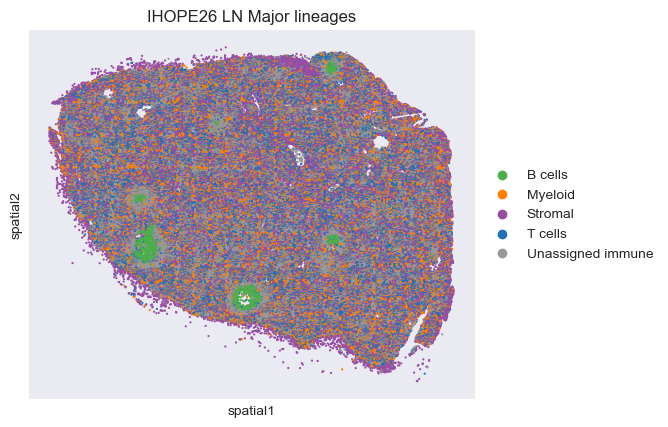

In [72]:
# Plot major cell types
sc.pl.spatial(adata, color='leiden_celltype_major', title='IHOPE26 LN Major lineages',
              spot_size=30, palette=major_palette)

/var/folders/30/65bd79gx1xq3x7x5jng74jrh0000gn/T/ipykernel_96467/2677375546.py:2: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color='leiden_celltype_fine',  title='IHOPE26 LN Finer cell types',


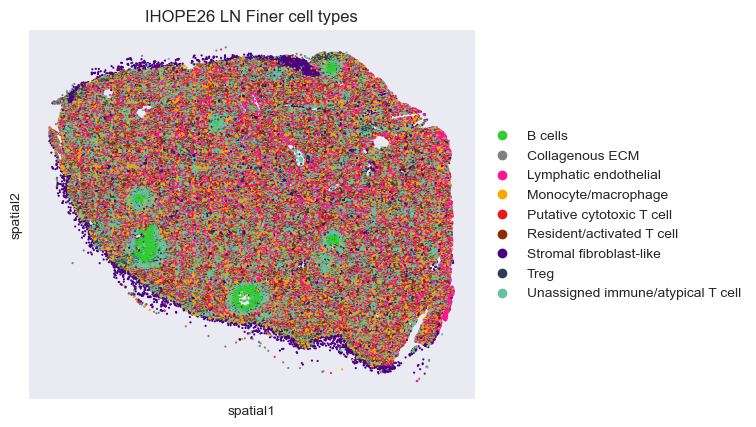

In [83]:
# Plot fine cell types
sc.pl.spatial(adata, color='leiden_celltype_fine',  title='IHOPE26 LN Finer cell types',
              legend_loc='right margin', spot_size=30, palette=fine_palette)


/var/folders/30/65bd79gx1xq3x7x5jng74jrh0000gn/T/ipykernel_96467/1665494645.py:12: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


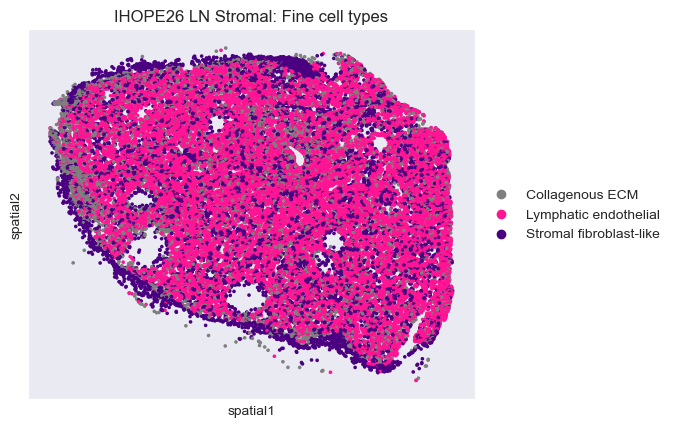

/var/folders/30/65bd79gx1xq3x7x5jng74jrh0000gn/T/ipykernel_96467/1665494645.py:12: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


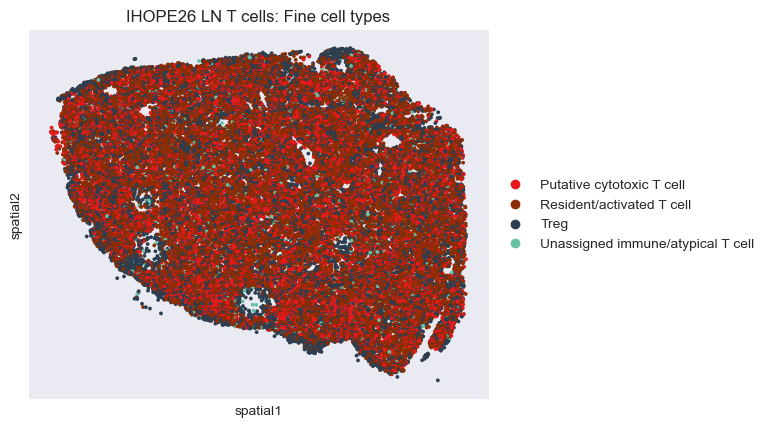

/var/folders/30/65bd79gx1xq3x7x5jng74jrh0000gn/T/ipykernel_96467/1665494645.py:12: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


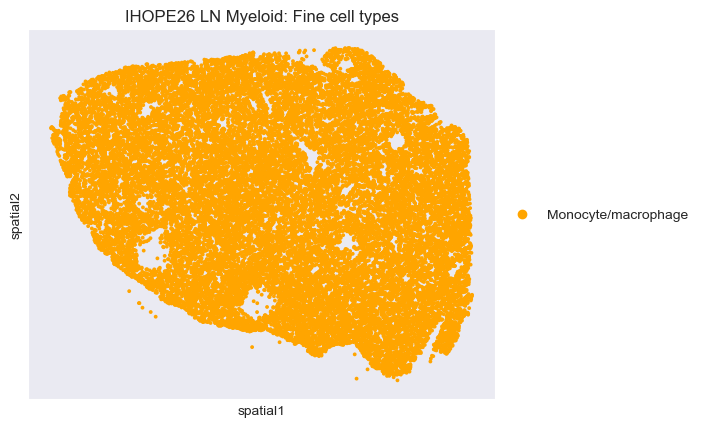

/var/folders/30/65bd79gx1xq3x7x5jng74jrh0000gn/T/ipykernel_96467/1665494645.py:12: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


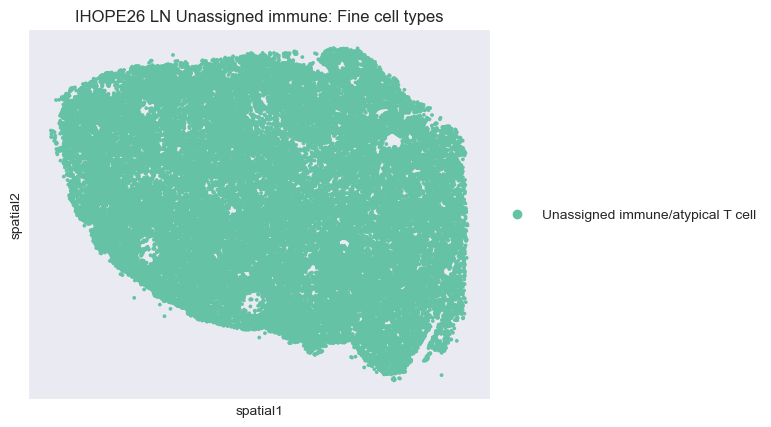

/var/folders/30/65bd79gx1xq3x7x5jng74jrh0000gn/T/ipykernel_96467/1665494645.py:12: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


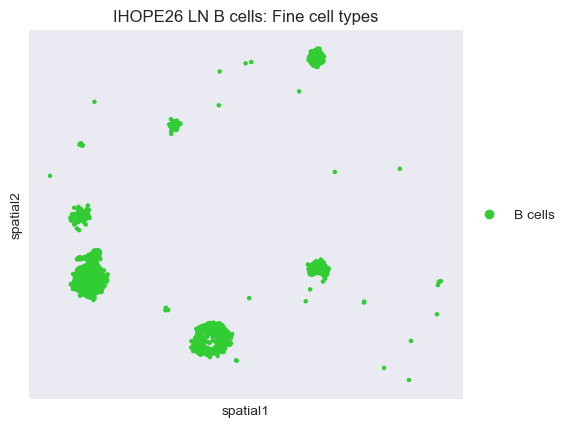

In [84]:
# Less cluttered plots for fine cell types:
# Get all major lineages
major_lineages = adata.obs['leiden_celltype_major'].unique()

# Loop over major lineages and plot fine types spatially within each
for major in adata.obs['leiden_celltype_major'].unique():
    # Subset to cells in this major lineage
    mask = adata.obs['leiden_celltype_major'] == major
    adata_sub = adata[mask].copy()

    # Plot using the full fine_palette
    sc.pl.spatial(
        adata_sub,
        color='leiden_celltype_fine',
        title=f'IHOPE26 LN {major}: Fine cell types',
        spot_size=30,
        palette=fine_palette,
        legend_loc='right margin'
    )



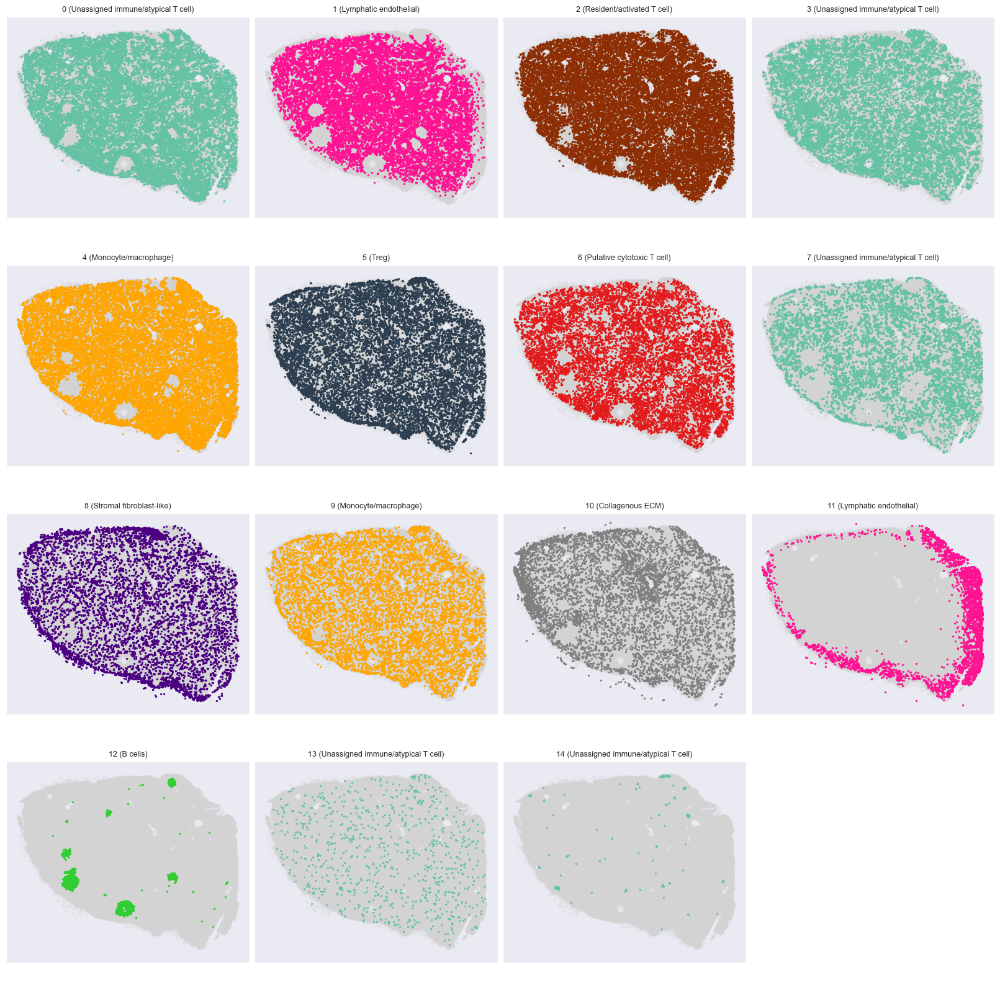

In [44]:
# Summary of spatial distribution of clusters and cell types:
coords = adata.obsm["spatial"]
x, y = coords[:, 0], coords[:, 1]
clusters = adata.obs["leiden"].astype(str)

unique_clusters = sorted(clusters.unique(), key=int)

n_cols = 4
n_rows = math.ceil(len(unique_clusters) / n_cols)

fig, axes = plt.subplots(
    n_rows, n_cols,
    figsize=(4 * n_cols, 4 * n_rows),
    constrained_layout=True
)

axes = axes.flatten()

for ax, cl in zip(axes, unique_clusters):
    mask = clusters == cl

    ax.scatter(
        x[~mask], y[~mask],
        c="lightgrey", s=2, alpha=0.05
    )

    label = f"{cl} ({adata.obs.loc[mask, 'leiden_celltype_fine'].iloc[0]})"
    color = fine_palette.get(
        adata.obs.loc[mask, 'leiden_celltype_fine'].iloc[0],
        "#999999"
    )

    ax.scatter(
        x[mask], y[mask],
        c=color, s=2, alpha=0.9
    )

    ax.set_title(label, fontsize=9)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.invert_yaxis()
    ax.set_aspect("equal")

for ax in axes[len(unique_clusters):]:
    ax.axis("off")

plt.show()

If good enough, save anndata for later:

In [85]:
adata.write("../data/processed/anndata/IHOPE26_RAW_all_annotations_revised1.h5ad")

# Comparing the cell type annotation methods
Here follows an example of how cell type distributions can be compared between the different annotation methods.

In [107]:
# If in new session, load adata with all the desired annotations
adata = sc.read_h5ad("../data/processed/anndata/IHOPE26_RAW_all_annotations_revised1.h5ad")

In [108]:
print("Manual GMM subtypes:")
print(adata.obs['subtype'].value_counts())

print("\nLeiden fine cell types:")
print(adata.obs['leiden_celltype_fine'].value_counts())

print("\nManual GMM major cell types:")
print(adata.obs['type'].value_counts())

print("\nLeiden major cell types:")
print(adata.obs['leiden_celltype_major'].value_counts())


Manual GMM subtypes:
subtype
Stromal_Unclassified     43205
Lymphatic_Endothelial    41889
Unclassified_subtype     26897
Basement Membrane        19022
CD8_T                    16170
Memory_B                 10407
Tissue_Resident_T         6295
Fibroblast                4725
Activated_B               4504
B_Unclassified            3732
CD4_T                     3040
Monocyte/Macrophage       2593
Naive_T                   1237
Endothelial               1049
Follicular_like_B          972
GC_like_B                  428
T_Unclassified             239
Plasma_like                194
cDC1                       176
Myeloid_Unclassified       174
FDC                        117
Th17_like                   17
TfH_like                     7
cDC2                         7
Treg                         1
Name: count, dtype: int64

Leiden fine cell types:
leiden_celltype_fine
Unassigned immune/atypical T cell    60036
Lymphatic endothelial                29719
Monocyte/macrophage                  2

**Contingency tables/confusion matrices**

Interpret as: For each manual category, the distribution over Leiden categories. Agreement on single cell level.

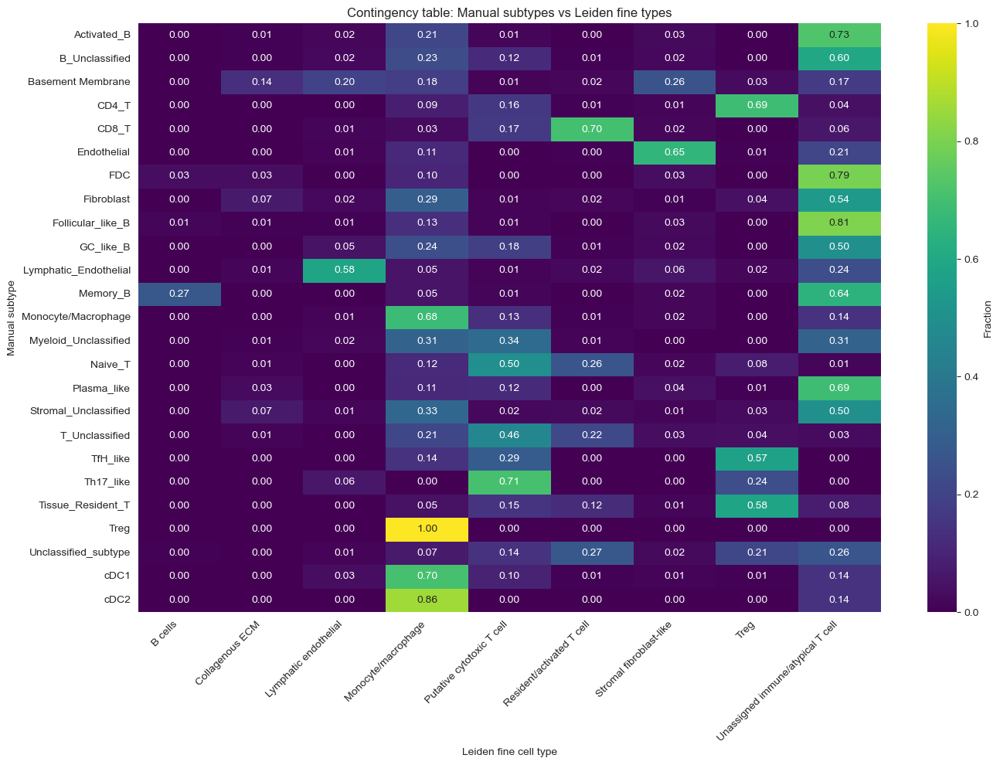

In [88]:
# Build a confusion matrix/contingency table of overlap between fine cell types
conf_mat = pd.crosstab(
    adata.obs['subtype'],
    adata.obs['leiden_celltype_fine'],
    normalize='index'  # optional: proportion per manual subtype
)

# Plot the confusion matrix as a heatmap
plt.figure(figsize=(14,10))
sns.heatmap(conf_mat, annot=True, fmt='.2f', cmap='viridis', cbar_kws={'label': 'Fraction'})
plt.title('Contingency table: Manual subtypes vs Leiden fine types')
plt.ylabel('Manual subtype')
plt.xlabel('Leiden fine cell type')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

The numerical summary table of top matches:

In [53]:
# Build raw contingency table (counts)
ct = pd.crosstab(
    adata.obs['subtype'],
    adata.obs['leiden_celltype_fine']
)

# Normalize per manual subtype
ct_norm = ct.div(ct.sum(axis=1), axis=0)

# Extract top Leiden match per manual subtype
top_matches = (
    ct_norm
    .stack()
    .reset_index()
    .rename(columns={0: 'fraction'})
    .sort_values(['subtype', 'fraction'], ascending=[True, False])
    .groupby('subtype')
    .head(1)
    .reset_index(drop=True)
)

# Convert to percentage
top_matches['percentage'] = top_matches['fraction'] * 100

# Optional: add absolute cell counts for concordant cells
top_matches['n_cells'] = top_matches.apply(
    lambda row: ct.loc[row['subtype'], row['leiden_celltype_fine']],
    axis=1
)

# Final sorting by descending agreement
top_matches = top_matches.sort_values('percentage', ascending=False)

top_matches


,subtype,leiden_celltype_fine,fraction,percentage,n_cells
21,Treg,Monocyte/macrophage,1.000000,100.000000,1
24,cDC2,Monocyte/macrophage,0.857143,85.714286,6
8,Follicular_like_B,Unassigned immune/atypical T cell,0.805556,80.555556,783
6,FDC,Unassigned immune/atypical T cell,0.794872,79.487179,93
0,Activated_B,Unassigned immune/atypical T cell,0.725133,72.513321,3266
19,Th17_like,Putative cytotoxic T cell,0.705882,70.588235,12
23,cDC1,Monocyte/macrophage,0.704545,70.454545,124
4,CD8_T,Resident/activated T cell,0.702474,70.247372,11359
15,Plasma_like,Unassigned immune/atypical T cell,0.690722,69.072165,134
3,CD4_T,Treg,0.689474,68.947368,2096


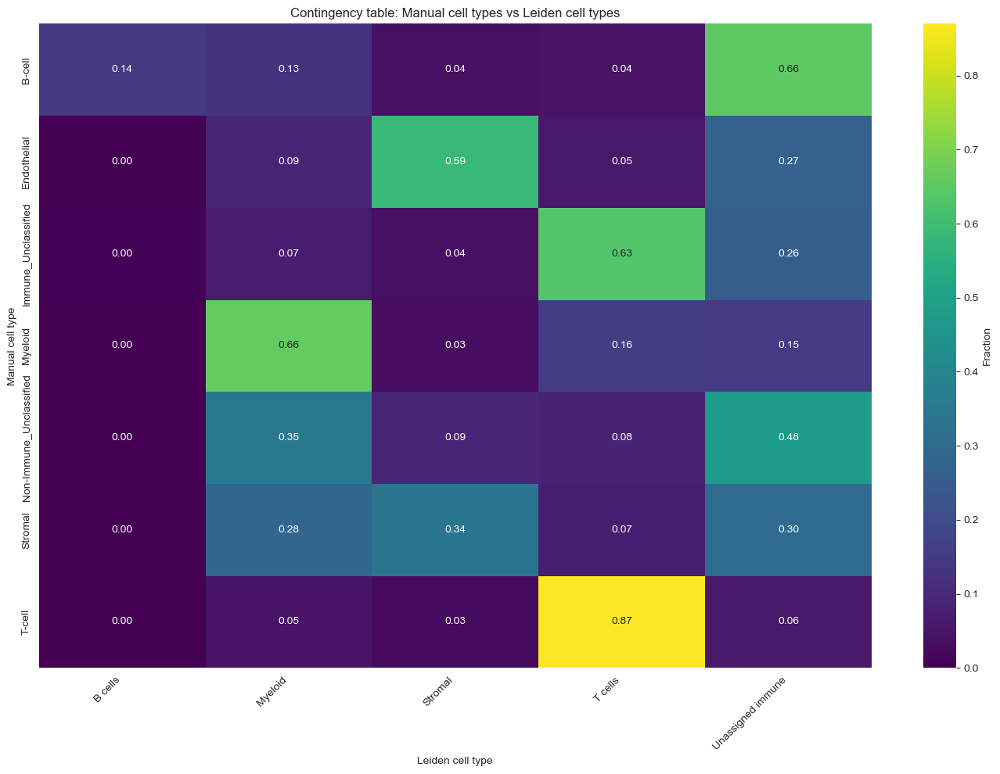

In [89]:
# Build a confusion matrix/contingency table of overlap between broad cell types
conf_mat = pd.crosstab(
    adata.obs['type'],
    adata.obs['leiden_celltype_major'],
    normalize='index'  # optional: proportion per manual subtype
)

# Plot the confusion matrix as a heatmap
plt.figure(figsize=(14,10))
sns.heatmap(conf_mat, annot=True, fmt='.2f', cmap='viridis', cbar_kws={'label': 'Fraction'})
plt.title('Contingency table: Manual cell types vs Leiden cell types')
plt.ylabel('Manual cell type')
plt.xlabel('Leiden cell type')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

**Pearson correlation between Leiden-based and GMM-based annotations**

Compares patterns of abundance across cells or clusters. Interpret as an agreement in where the cell types live across clusters. "Do clusters enriched for “T-cell” manually also enrich “T cells” by Leiden?" or "Does the fraction of a manual cell type vary in the same pattern across Leiden clusters?"

High r means agreement in where these cell types live, 0 means unrelated, negative means mutual exclusiveness in assignment. Note that this is a linear correlation method, and the correlation is between vectors of cell-type proportions across clusters. Not between cell types per se.

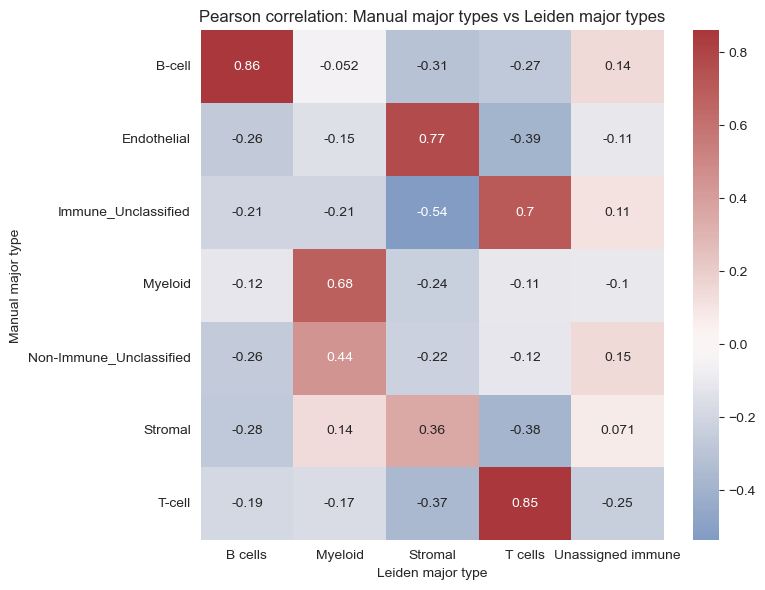

In [91]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Per-cluster compositions (as before)
manual_major = pd.crosstab(
    adata.obs['leiden'],
    adata.obs['type'],
    normalize='index'
)

leiden_major = pd.crosstab(
    adata.obs['leiden'],
    adata.obs['leiden_celltype_major'],
    normalize='index'
)

# Build correlation matrix explicitly
corr_major_full = pd.DataFrame(
    index=manual_major.columns,
    columns=leiden_major.columns,
    dtype=float
)

for m in manual_major.columns:
    for l in leiden_major.columns:
        corr_major_full.loc[m, l] = manual_major[m].corr(leiden_major[l])


plt.figure(figsize=(8,6))
sns.heatmap(
    corr_major_full,
    annot=True,
    cmap='vlag',
    center=0
)
plt.title('Pearson correlation: Manual major types vs Leiden major types')
plt.ylabel('Manual major type')
plt.xlabel('Leiden major type')
plt.tight_layout()
plt.show()



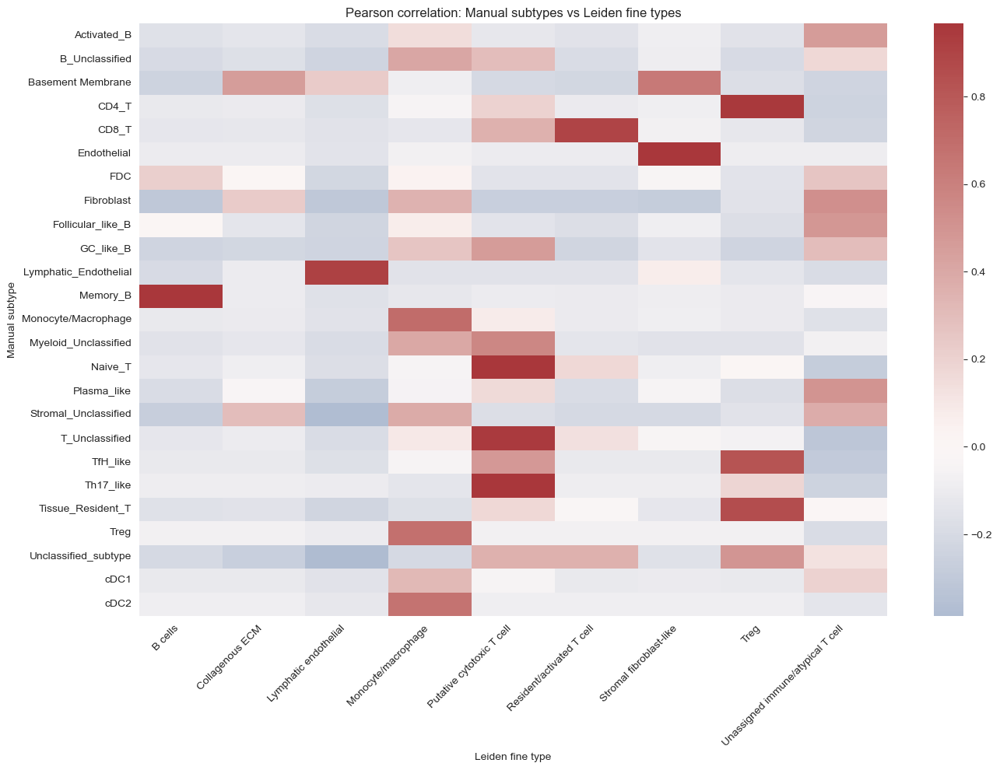

In [90]:
manual_fine = pd.crosstab(
    adata.obs['leiden'],
    adata.obs['subtype'],
    normalize='index'
)

leiden_fine = pd.crosstab(
    adata.obs['leiden'],
    adata.obs['leiden_celltype_fine'],
    normalize='index'
)

corr_fine = pd.DataFrame(
    index=manual_fine.columns,
    columns=leiden_fine.columns,
    dtype=float
)

for m in manual_fine.columns:
    for l in leiden_fine.columns:
        corr_fine.loc[m, l] = manual_fine[m].corr(leiden_fine[l])

# Plot
plt.figure(figsize=(14,10))
sns.heatmap(
    corr_fine,
    cmap='vlag',
    center=0
)
plt.title('Pearson correlation: Manual subtypes vs Leiden fine types')
plt.ylabel('Manual subtype')
plt.xlabel('Leiden fine type')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


**Chi-squared test**

Better suited for categorical data. Standardized residuals (observed - expected)/sqrt(expected) show which combinations are over- or under-represented.

Chi-squared statistic: 177725.94, p-value: 0.00e+00, degrees of freedom: 24


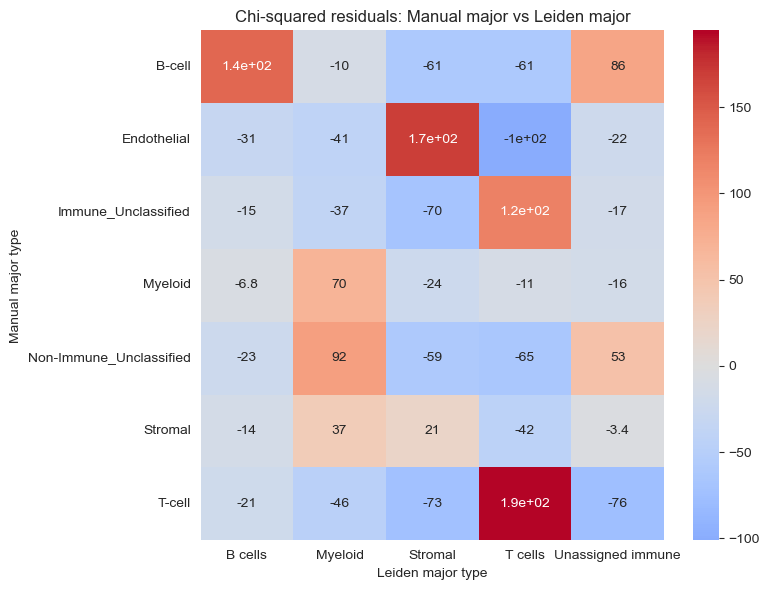

In [92]:
# Build contingency table: counts of cells
contingency_major = pd.crosstab(
    adata.obs['type'],
    adata.obs['leiden_celltype_major']
)

# Chi-squared test
chi2, p, dof, expected = chi2_contingency(contingency_major)
print(f"Chi-squared statistic: {chi2:.2f}, p-value: {p:.2e}, degrees of freedom: {dof}")

# Optional: visualize observed vs expected as a heatmap (residuals)
residuals = (contingency_major - expected) / expected**0.5  # standardized residuals

plt.figure(figsize=(8,6))
sns.heatmap(residuals, annot=True, cmap='coolwarm', center=0)
plt.title('Chi-squared residuals: Manual major vs Leiden major')
plt.ylabel('Manual major type')
plt.xlabel('Leiden major type')
plt.tight_layout()
plt.show()


Chi-squared statistic: 316634.45, p-value: 0.00e+00, degrees of freedom: 192


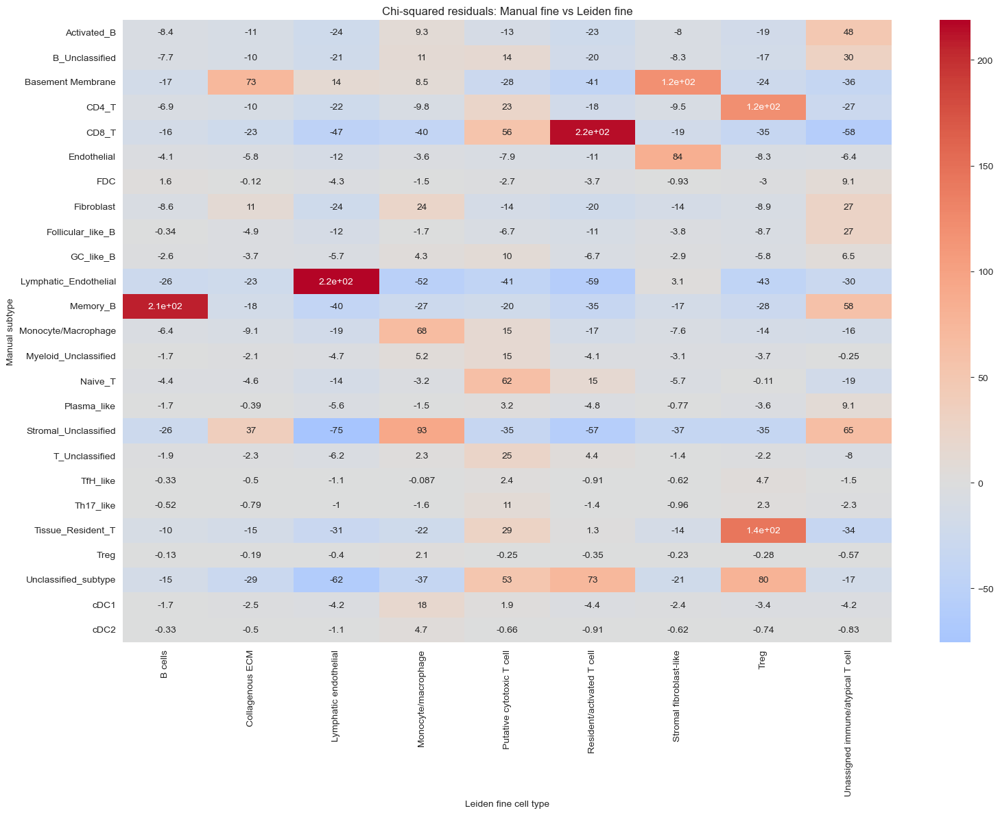

In [94]:
# Build contingency table: counts of cells
contingency_fine = pd.crosstab(
    adata.obs['subtype'],
    adata.obs['leiden_celltype_fine']
)

# Chi-squared test
chi2, p, dof, expected = chi2_contingency(contingency_fine)
print(f"Chi-squared statistic: {chi2:.2f}, p-value: {p:.2e}, degrees of freedom: {dof}")

# Optional: visualize observed vs expected as a heatmap (residuals)
residuals = (contingency_fine - expected) / expected**0.5  # standardized residuals

plt.figure(figsize=(16,12))
sns.heatmap(residuals, annot=True, cmap='coolwarm', center=0)
plt.title('Chi-squared residuals: Manual fine vs Leiden fine')
plt.ylabel('Manual subtype')
plt.xlabel('Leiden fine cell type')
plt.tight_layout()
plt.show()


**ARI:**

"If I randomly pick two cells, do the two annotation methods agree on whether those cells belong to the same group?"

ARI ~0.2–0.4 → partial concordance

ARI >0.5 → strong agreement

ARI ~0 → near chance (often due to resolution mismatch)

In [50]:
# Safety checks
required_cols = [
    'type',
    'subtype',
    'leiden_celltype_major',
    'leiden_celltype_fine'
]

missing = [c for c in required_cols if c not in adata.obs.columns]
if missing:
    raise ValueError(f"Missing columns in adata.obs: {missing}")

# Ensure string labels
for c in required_cols:
    adata.obs[c] = adata.obs[c].astype(str)

# ARI calculations
ari_major = adjusted_rand_score(
    adata.obs['type'],
    adata.obs['leiden_celltype_major']
)

ari_fine = adjusted_rand_score(
    adata.obs['subtype'],
    adata.obs['leiden_celltype_fine']
)

print(f"Adjusted Rand Index (major cell types): {ari_major:.3f}")
print(f"Adjusted Rand Index (fine cell types):  {ari_fine:.3f}")


Adjusted Rand Index (major cell types): 0.228
Adjusted Rand Index (fine cell types):  0.190


**AMI**

Adjusted Mutual Information between two clusterings.

Adjusted Mutual Information (AMI) is an adjustment of the Mutual Information (MI) score to account for chance. It accounts for the fact that the MI is generally higher for two clusterings with a larger number of clusters, regardless of whether there is actually more information shared.

The AMI returns a value of 1 when the two partitions are identical (ie perfectly matched). Random partitions (independent labellings) have an expected AMI around 0 on average hence can be negative. The value is in adjusted nats (based on the natural logarithm).

(sklearn)

In [51]:
from sklearn.metrics import adjusted_mutual_info_score

# Safety checks
required_cols = [
    'type',
    'subtype',
    'leiden_celltype_major',
    'leiden_celltype_fine'
]

missing = [c for c in required_cols if c not in adata.obs.columns]
if missing:
    raise ValueError(f"Missing columns in adata.obs: {missing}")

# Ensure string labels
for c in required_cols:
    adata.obs[c] = adata.obs[c].astype(str)

# AMI calculations
ami_major = adjusted_mutual_info_score(
    adata.obs['type'],
    adata.obs['leiden_celltype_major']
)

ami_fine = adjusted_mutual_info_score(
    adata.obs['subtype'],
    adata.obs['leiden_celltype_fine']
)

print(f"Adjusted Mutual Information (major cell types): {ami_major:.3f}")
print(f"Adjusted Mutual Information (fine cell types):  {ami_fine:.3f}")


Adjusted Mutual Information (major cell types): 0.268
Adjusted Mutual Information (fine cell types):  0.295
